# Pangal tutorial: NGC 3351


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LogNorm

import glob
import sys, os
sys.path.append(os.path.expanduser('~/Desktop/Pangal'))

from pangal.pangal import PanGal
from pangal.region import Region
from pangal.plot import Point, Contours
from pangal.photometry_table import PhotometryTable, PhotometryCatalog

import warnings
warnings.simplefilter("ignore")


We will use as an example the galaxy NGC 3351 in Leo.

Pangal requires the RA and Dec coordinates of the object, in deg.

In [3]:
# From NASA/IPAC extragalactic database
# https://ned.ipac.caltech.edu
z_true = 0.002598
ra_center, dec_center = 160.990603, 11.703740

distance = 11.62 # Mpc

#M_star = 10**10.32
#V = Md_to_Vc(M_star)

#print(V)
#spin = 0.05
#print(Rd(V,spin))

# Convert angular scale to physical scale
from astropy.cosmology import Planck18 as cosmo
z_Coma = 0.023513
D_A = cosmo.angular_diameter_distance(z_Coma).to('pc').value

theta_deg_1kpc = 1e3 / D_A / (np.pi / 180)               # Convert 1 kpc in deg
theta_arcsec_1kpc = 1e3 / D_A / (np.pi / 648000)         # Convert 1 kpc in arcsec



Pangal wants in input a list of fits files from specific archives:

LIST OF ARCHIVES

- **Galex**: MAST (https://mast.stsci.edu/portal/Mashup/Clients/Mast/Portal.html)
fits files: fd-int.fits (FUV) and nd-int.fits (NUV) intensity image (counts/s per pixel). int.fits are the science images. Discard cnt (raw photon counts), rrhr/rrlr (response or relative response maps), skybg (estimated sky background), exp (exposure map) and flags.

- **HST**: MAST for Hubble (https://mast.stsci.edu/search/ui/#/hst)
HAP-SVM (Single-Visit Mosaics) or HAP-MVM (Multi-Visit Mosaics) are the science ready, drizzled images DCR-combined heavier. DRZ is fine (no CTE correction)


- **Spitzer IRAC**: (https://irsa.ipac.caltech.edu/data/SPITZER/docs/spitzerdataarchives/)
  maic (mosaic) image.

- **Herschel PACS**: (https://archives.esac.esa.int/hsa/whsa/)

In [18]:
directory = '/home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/'

muse_file =  glob.glob(directory+'*MUSE*.fits')
spitzer_files = glob.glob(directory+'*SPITZER_*.fits')
sdss_files = glob.glob(directory+'*sdss*.fits')
wise_files = glob.glob(directory+'*WISE*.fits')
hershel_files = glob.glob(directory+'*hpacs*.fits')
twomass_files = glob.glob(directory+'*2mass*.fits')
hst_files = glob.glob(directory+'*hst*.fits')
galex_files = glob.glob(directory+'*galex*.fits')

files_list =  galex_files + sdss_files + twomass_files + spitzer_files + hershel_files +hst_files + wise_files #+ muse_file +


In [19]:
print(files_list)

['/home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/galex_fuv.fits', '/home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/galex_nuv.fits', '/home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/SPITZER_I2_irac_5521408_0000_6_E8756882_maic.fits', '/home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/SPITZER_irac_I4_5521408_0000_6_E8756901_maic.fits', '/home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/SPITZER_irac_I1_5521408_0000_6_E8756911_maic.fits', '/home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/SPITZER__irac_I3_5521408_0000_6_E8756791_maic.fits', '/home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/hst_wfc3_f814w_idxr19030_drz.fits']


In [20]:
galaxy = PanGal(fits_files=files_list,target_coords = [ra_center,dec_center],fov=1/4,EBmV=0.0,EBmV_err=0.0)


Processing GALEX file:  /home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/galex_fuv.fits
Processing GALEX file:  /home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/galex_nuv.fits
Processing IRAC:  /home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/SPITZER_I2_irac_5521408_0000_6_E8756882_maic.fits
Processing IRAC:  /home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/SPITZER_irac_I4_5521408_0000_6_E8756901_maic.fits
Processing IRAC:  /home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/SPITZER_irac_I1_5521408_0000_6_E8756911_maic.fits
Processing IRAC:  /home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/SPITZER__irac_I3_5521408_0000_6_E8756791_maic.fits
Processing HST files:  /home/utente/Desktop/Pangal/DATA/GALAXIES/NGC 3351/hst_wfc3_f814w_idxr19030_drz.fits


In [21]:
galaxy.overview

Images: 

['galex_fuv', 'galex_nuv', 'spitzer_irac_2', 'spitzer_irac_4', 'spitzer_irac_1', 'spitzer_irac_3', 'hst_wfc3_uvis_f814w']

Cubes: 

[]


To check the data stored in the new PanGal object:

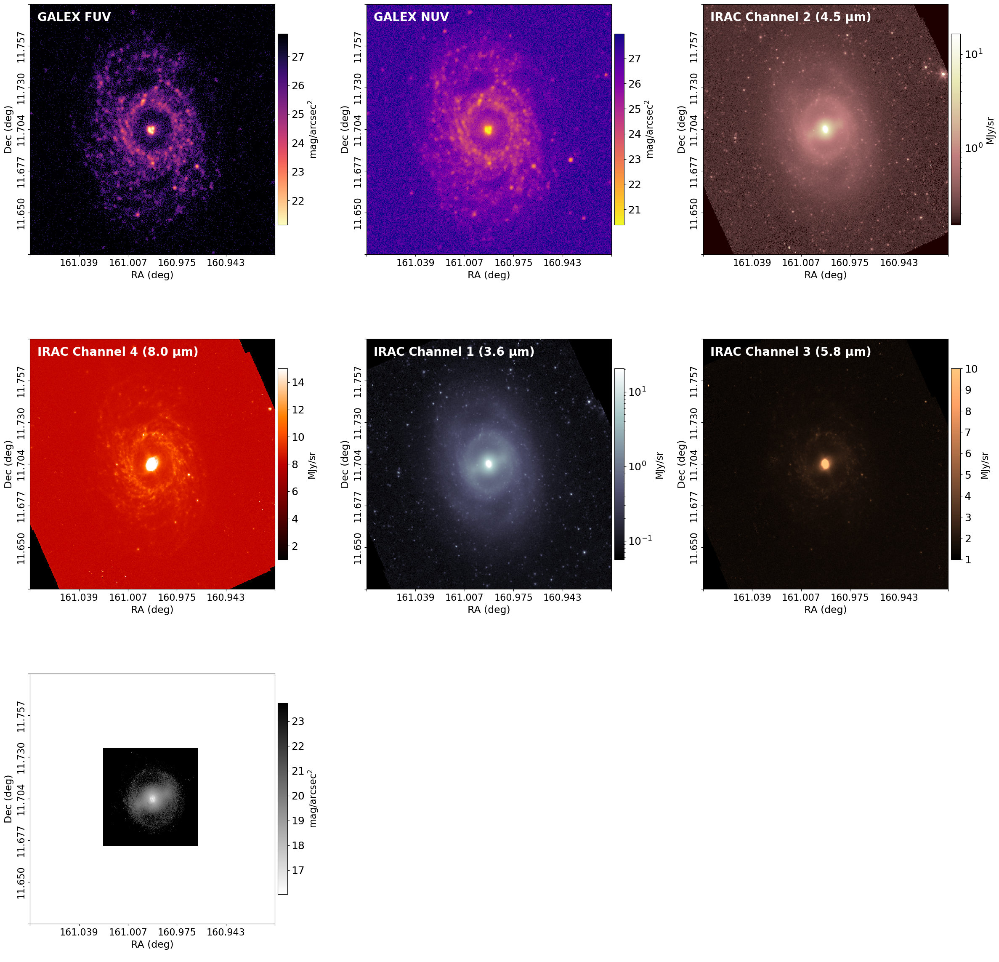

In [22]:
galaxy.plot( 
                
              # bands to plot. Can be just one
              # bands = 'galex_fuv',
              bands=['galex_fuv', 'galex_nuv', 'spitzer_irac_2', 'spitzer_irac_4', 'spitzer_irac_1', 'spitzer_irac_3', 'hst_wfc3_uvis_f814w'],
              
              plots_per_row=3, # Number of plots for each row
              #figsize= (10,5)  
              
              auto_titles=True,            # Enables automatic titles
              auto_titles_style=1,         # Style of autotitle. Can be 0 or 1
              auto_title_fontsize=20,      # Fontsize of autotitle
              auto_title_color='white',    # color of autotitle font

              axis_label_fontsize=17,      
              axis_ticks_fontsize=16,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,

              ra_min = ra_center-0.08,
              ra_max = ra_center+0.08,
              dec_min = dec_center-0.08,
              dec_max = dec_center+0.08,

              set_cmaps = {'galex_nuv':'plasma',
                           'galex_fuv':'magma',
                           'spitzer_irac_1':'bone',
                           'spitzer_irac_2':'pink',
                           'spitzer_irac_3':'copper',
                           'spitzer_irac_4':'gist_heat',
                           'herschel_pacs_70um':'GnBu_r',
                           'herschel_pacs_100um':'YlGn_r',
                           'herschel_pacs_160um':'OrRd_r',
                          },
              
              set_scale_lims = {
                                'spitzer_irac_3':(1,10),
                                'spitzer_irac_4':(1,15),
                                'herschel_pacs_70um':(1,200),
                                'herschel_pacs_100um':(1,200),
                                'herschel_pacs_160um':(1,200),  
                               },         
            )


In [28]:
galaxy.cubes.muse.line_map(line='Ha', width=10, continuum_offset_1=50, continuum_offset_2=50, z=z_true,pangal_object=galaxy);
galaxy.cubes.muse.line_map(line='Hb', width=20, continuum_offset_1=50, continuum_offset_2=50, z=z_true,pangal_object=galaxy);

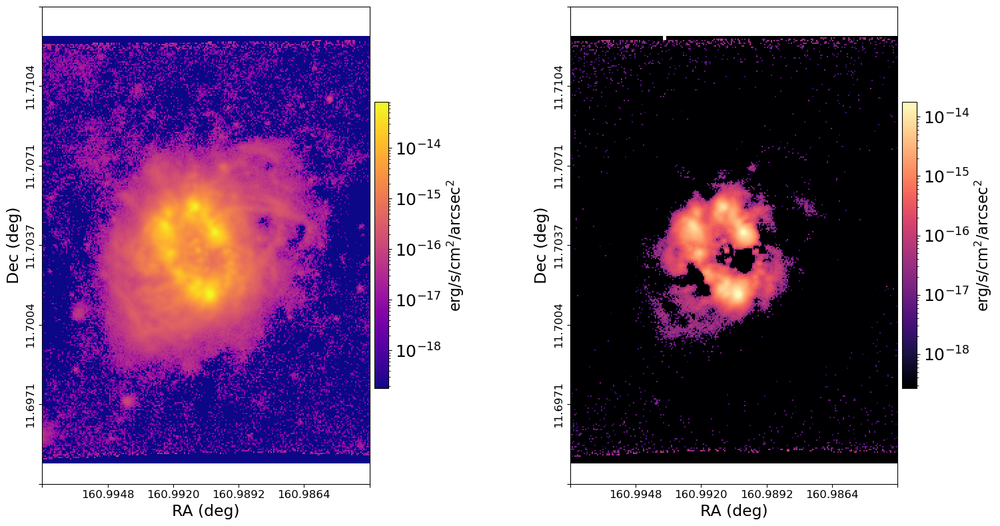

In [29]:
galaxy.plot( 
                
              # bands to plot. Can be just one
              # bands = 'galex_fuv',
              bands=['muse_Ha','muse_Hb'],
              
              plots_per_row=2, # Number of plots for each row
              #figsize= (10,5)  
              
              auto_titles=True,            # Enables automatic titles
              auto_titles_style=1,         # Style of autotitle. Can be 0 or 1
              auto_title_fontsize=20,      # Fontsize of autotitle
              auto_title_color='white',    # color of autotitle font

              axis_label_fontsize=17,
              axis_ticks_fontsize=12,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,

              ra_min = ra_center-0.007,
              ra_max = ra_center+0.007,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.01,

              set_units = {'muse_Ha':'erg_s_cm2_arcsec2','muse_Hb':'erg_s_cm2_arcsec2'},
              set_cmaps = {'muse_Ha':'plasma','muse_Hb':'magma',},
      
            )

In [2]:
galaxy.list


NameError: name 'galaxy' is not defined

To access a specific image (for example SDSS r image)

In [1]:
# One way to access a specific band
#galaxy.images['sdss_r']

# easy access with dot-notation (galaxy.images.sdss_r) and IDE auto-completion
galaxy.images.sdss_r

NameError: name 'galaxy' is not defined

### Access header and WCS of each image

In [7]:
print(repr(galaxy.images.sdss_r.header))

galaxy.images.sdss_r.wcs

SIMPLE  =                    T /                                                
BITPIX  =                  -32 / 32 bit floating point                          
NAXIS   =                    2                                                  
NAXIS1  =                 2048                                                  
NAXIS2  =                 1489                                                  
EXTEND  =                    T /Extensions may be present                       
BZERO   =              0.00000 /Set by MRD_SCALE                                
BSCALE  =              1.00000 /Set by MRD_SCALE                                
TAI     =        4612757879.18 / 1st row - Number of seconds since Nov 17 1858  
RA      =            193.71699 / 1st row - Right ascension of telescope boresigh
DEC     =            27.228268 / 1st row - Declination of telescope boresight (d
SPA     =              94.013  / 1st row - Camera col position angle wrt north (
IPA     =             165.12

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN' 'DEC--TAN' 
CRVAL : 194.5070606688116 28.253334105087863 
CRPIX : 262.5 307.5 
CD1_1 CD1_2  : -0.000109998089309837 6.369212330607158e-07 
CD2_1 CD2_2  : 6.562972828957663e-07 0.00011001711726407971 
NAXIS : 2048  1489

# Plot an image

### Plot method to view the images

Many options: 

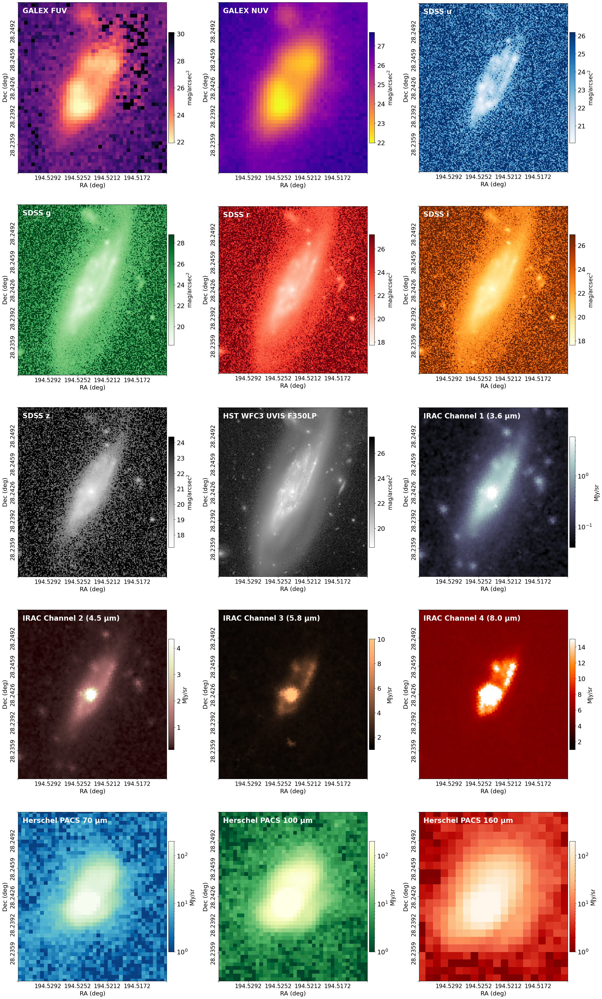

In [ ]:
galaxy.plot( 
                
              # bands to plot. Can be just one
              # bands = 'galex_fuv',
              bands=['galex_fuv','galex_nuv','sdss_u','sdss_g','sdss_r','sdss_i','sdss_z','hst_wfc3_uvis_f350lp','spitzer_irac_1',
                     'spitzer_irac_2','spitzer_irac_3','spitzer_irac_4',
                     'herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
              
              plots_per_row=3, # Number of plots for each row
              #figsize= (10,5)  
              
              auto_titles=True,            # Enables automatic titles
              auto_titles_style=1,         # Style of autotitle. Can be 0 or 1
              auto_title_fontsize=20,      # Fontsize of autotitle
              auto_title_color='white',    # color of autotitle font

              axis_label_fontsize=17,
              axis_ticks_fontsize=16,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,

              ra_min = ra_center-0.01,
              ra_max = ra_center+0.01,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.01,

              set_cmaps = {'galex_nuv':'plasma',
                           'galex_fuv':'magma',
                           'spitzer_irac_1':'bone',
                           'spitzer_irac_2':'pink',
                           'spitzer_irac_3':'copper',
                           'spitzer_irac_4':'gist_heat',
                           'herschel_pacs_70um':'GnBu_r',
                           'herschel_pacs_100um':'YlGn_r',
                           'herschel_pacs_160um':'OrRd_r',
                          },
              
              set_scale_lims = {
                                'spitzer_irac_3':(1,10),
                                'spitzer_irac_4':(1,15),
                                'herschel_pacs_70um':(1,200),
                                'herschel_pacs_100um':(1,200),
                                'herschel_pacs_160um':(1,200),  
                               },         
            )



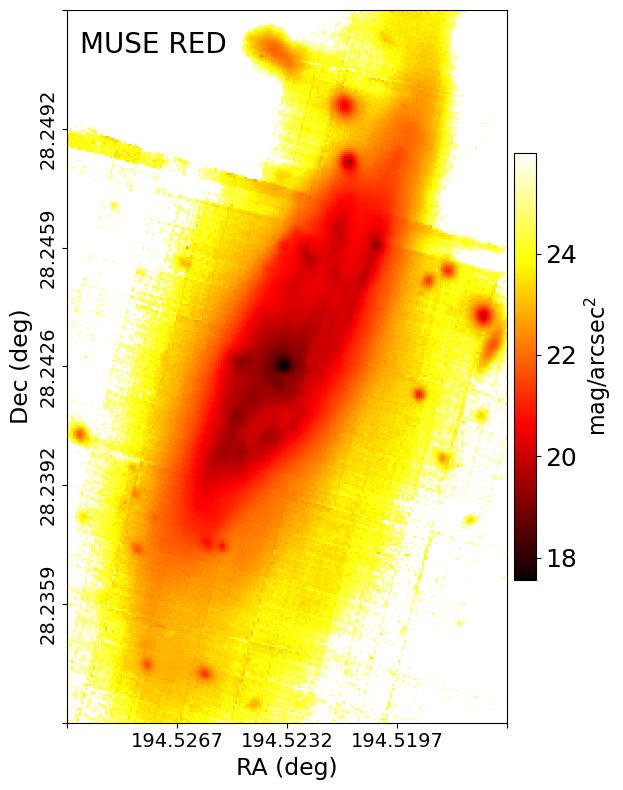

In [14]:
galaxy.plot( 
                
              # bands to plot. Can be just one
              bands = ['muse_red'],
              plots_per_row=1, # Number of plots for each row
              #figsize= (10,5)  
              
              auto_titles=True,            # Enables automatic titles
              auto_titles_style=0,         # Style of autotitle. Can be 0 or 1
              auto_title_fontsize=20,      # Fontsize of autotitle
              auto_title_color='black',    # color of autotitle font

              axis_label_fontsize=17,
              axis_ticks_fontsize=14,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=3,

              ra_min = ra_center-0.007,
              ra_max = ra_center+0.007,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.01,

              set_cmaps = {'muse_red':'hot_r'},

            )



Extract line maps from MUSE cube

In [16]:
galaxy.cubes.muse.line_map(line='Ha', width=10, continuum_offset_1=50, continuum_offset_2=50, z=z_true,pangal_object=galaxy);
galaxy.cubes.muse.line_map(line='Hb', width=10, continuum_offset_1=50, continuum_offset_2=50, z=z_true,pangal_object=galaxy);

Ha flux extracted in the range 6715.34-6725.34 Å
Continuum extracted in the ranges 6670.34-6680.34 Å and 6770.34-6780.34 Å
Hb flux extracted in the range 4972.54-4982.54 Å
Continuum extracted in the ranges 4927.54-4937.54 Å and 5027.54-5037.54 Å


In [10]:
galaxy.list

Images: 

['galex_nuv', 'galex_fuv', 'muse_blue', 'muse_green', 'muse_red', 'muse_nir', 'muse_white_aoe', 'sdss_u', 'sdss_i', 'sdss_g', 'sdss_r', 'sdss_z', '2mass_h', '2mass_ks', '2mass_j', 'spitzer_irac_2', 'spitzer_irac_3', 'spitzer_irac_4', 'spitzer_irac_1', 'herschel_pacs_70um', 'herschel_pacs_160um', 'herschel_pacs_100um', 'hst_wfc3_uvis_f600lp', 'hst_wfc3_uvis_f350lp', 'wise_w4', 'wise_w1', 'wise_w2', 'wise_w3', 'muse_Ha', 'muse_Hb']

Cubes: 

['muse']


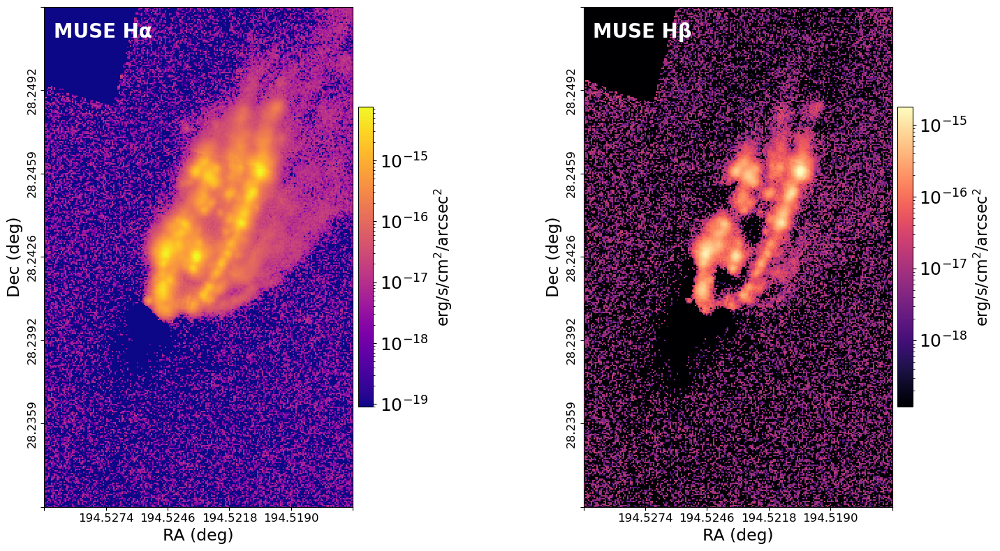

In [17]:
galaxy.plot( 
                
              # bands to plot. Can be just one
              # bands = 'galex_fuv',
              bands=['muse_Ha','muse_Hb'],
              
              plots_per_row=2, # Number of plots for each row
              #figsize= (10,5)  
              
              auto_titles=True,            # Enables automatic titles
              auto_titles_style=1,         # Style of autotitle. Can be 0 or 1
              auto_title_fontsize=20,      # Fontsize of autotitle
              auto_title_color='white',    # color of autotitle font

              axis_label_fontsize=17,
              axis_ticks_fontsize=12,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,

              ra_min = ra_center-0.007,
              ra_max = ra_center+0.007,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.01,

              set_units = {'muse_Ha':'erg_s_cm2_arcsec2','muse_Hb':'erg_s_cm2_arcsec2'},
              set_cmaps = {'muse_Ha':'plasma','muse_Hb':'magma',},
      
            )


### Define regions with basic shapes (circles, ellipses)

In [21]:
# Define regions to mask stars
circles = []
for ra, dec in [[ra_center,dec_center]]:
    circles.append(
        Region.circle(
            ra_center=ra, dec_center=dec, radius=0.001,
            wcs=galaxy.images['muse_red'].wcs,
            image_shape=galaxy.images['muse_red'].mag_arcsec2.shape,
            linewidth=2, linestyle=':', color='purple'
        )
    )

# Define standard regions as ellipses
axis_ratio = 0.3
angle = 62

ellipses = []
for R in [10, 20, 3.23]:
    ellipses.append(
        Region.ellipse(
            ra_center=ra_center, dec_center=dec_center,
            semimajor_axis=R * theta_deg_1kpc,
            axis_ratio=axis_ratio, angle=angle,
            wcs=galaxy.images['muse_red'].wcs,
            image_shape=galaxy.images['muse_red'].mag_arcsec2.shape,
            linewidth=2, linestyle=':', color='gainsboro'
        )
    )

### Define custom regions for specific purposes

In [4]:
muse_obj = galaxy.images['muse_red']
npix_1kpc = theta_deg_1kpc / muse_obj.dtheta_pix_deg         # number of pixels corresponding to 1 kpc

image = muse_obj.erg_s_cm2_A

m_semimajor_ax = np.tan(angle*np.pi/180)
m_sep_line = -1/m_semimajor_ax

# REGIONS FOR MC-SPF
# Define the separator (regions must exclude Ha and Hb)

ra_x_p, dec_x_p = 194.5239703, 28.2387352
x_center, y_center = muse_obj.wcs.all_world2pix([[ra_center,dec_center]],1)[0] 

x_p, y_p = 114, 131
ra_x_p, dec_y_p = muse_obj.wcs.all_pix2world([[x_p, y_p]], 0)[0]

y_coords, x_coords = np.meshgrid(np.linspace(0, image.shape[0], image.shape[0]),np.linspace(0, image.shape[1], image.shape[1]),indexing='ij')
exclude_Ha_mask = (y_coords < m_sep_line * (x_coords - x_p) + y_p)
# REGIONS ARE DEFINED ON MUSE

regions_for_mcspf = []
for i,r_kpc in enumerate(np.arange(6,18,3)):

    dr = 3
    region = EllipseAnnulusPixelRegion(
        center=PixCoord(x_center, y_center),
        inner_width = 2 * r_kpc * npix_1kpc, 
        
        outer_width = 2 * (r_kpc+dr) * npix_1kpc,  
        inner_height = axis_ratio * 2 * r_kpc * npix_1kpc,  
        outer_height = axis_ratio * 2 * (r_kpc+dr) * npix_1kpc,
        angle = angle*u.deg  
    )

    mask_elliptical_annulus = region.to_mask(mode='center').to_image(image.shape).astype(bool)
    mask = np.zeros_like(image, dtype=bool)
    mask |= (mask_elliptical_annulus & exclude_Ha_mask.astype(bool))


    if np.any(mask):

        R = r_kpc + dr/2
        print(R)
        x_centroid = x_center - R * npix_1kpc * np.cos(angle*np.pi/180)
        y_centroid = m_semimajor_ax * (x_centroid - x_center) + y_center 
        ra,dec = muse_obj.wcs.all_pix2world([[x_centroid, y_centroid]], 0)[0]

        regions_for_mcspf.append(Region(mask=mask,wcs=muse_obj.wcs,galactocentric_radius=R,caption_coords = [ra,dec],id=str(i+1))) 



NameError: name 'galaxy' is not defined

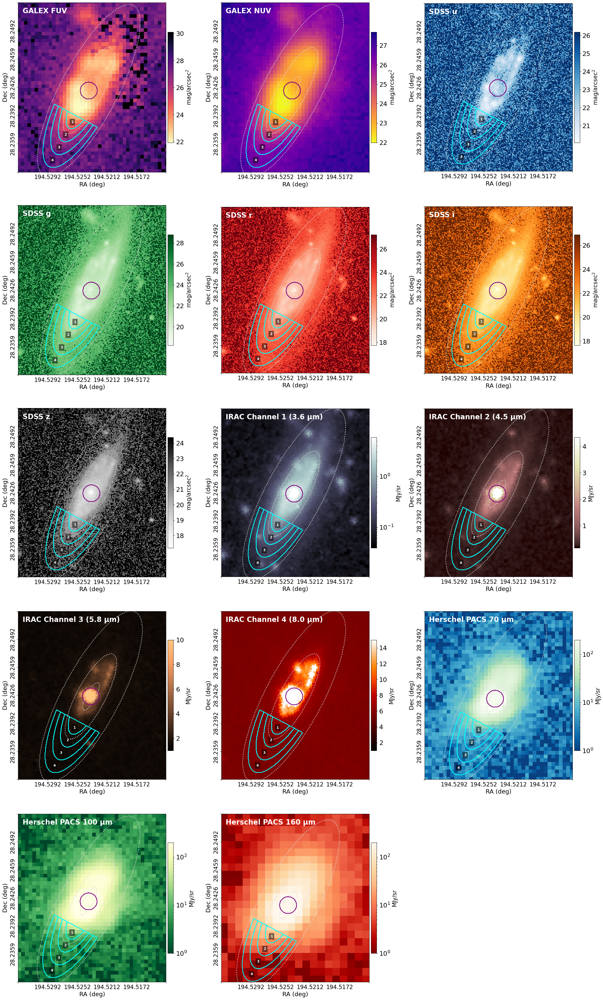

In [23]:

for c in circles:
    c.plot_aesthetic(linestyle='-')

galaxy.plot( 
                
              # bands to plot. Can be just one
              # bands = 'galex_fuv',
              bands=['galex_fuv','galex_nuv','sdss_u','sdss_g','sdss_r','sdss_i','sdss_z','spitzer_irac_1', #hst_wfc3_uvis_f350lp'
                     'spitzer_irac_2','spitzer_irac_3','spitzer_irac_4',
                     'herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
              
              plots_per_row=3, # Number of plots for each row
              #figsize= (10,5)  
              
              auto_titles=True,            # Enables automatic titles
              auto_titles_style=1,         # Style of autotitle. Can be 0 or 1
              auto_title_fontsize=20,      # Fontsize of autotitle
              auto_title_color='white',    # color of autotitle font

              axis_label_fontsize=17,
              axis_ticks_fontsize=16,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,

              ra_min = ra_center-0.01,
              ra_max = ra_center+0.01,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.01,

              set_cmaps = {'galex_nuv':'plasma',
                           'galex_fuv':'magma',
                           'spitzer_irac_1':'bone',
                           'spitzer_irac_2':'pink',
                           'spitzer_irac_3':'copper',
                           'spitzer_irac_4':'gist_heat',
                           'herschel_pacs_70um':'GnBu_r',
                           'herschel_pacs_100um':'YlGn_r',
                           'herschel_pacs_160um':'OrRd_r',
                          },
              
              set_scale_lims = {
                                'spitzer_irac_3':(1,10),
                                'spitzer_irac_4':(1,15),
                                'herschel_pacs_70um':(1,200),
                                'herschel_pacs_100um':(1,200),
                                'herschel_pacs_160um':(1,200),  
                               },      

                regions = ellipses + circles + regions_for_mcspf,
                           
            )

# Points and Contours

In [27]:
contours = [
    Contours(image=galaxy.images.muse_red.mag_arcsec2,wcs=galaxy.images.muse_red.wcs,levels=[22,23,24,25],
                     color='navy', linewidth=1.5,clabel_fontsize=12,clabel_fmt='%.0f',label='muse_red',), 
    Contours(image=galaxy.images.muse_Ha.erg_s_cm2_arcsec2,wcs=galaxy.images.muse_Ha.wcs,levels=[5e-18,1e-16,1e-15],
                     color='pink', linewidth=1.5,clabel_fontsize=12,clabel_fmt='%.1e',label='Ha',)
]


points=[Point(coords=(ra_center,dec_center),caption='NGC 4848',caption_fontsize=14,caption_offset=[0.02,0.03],color='navy',)]


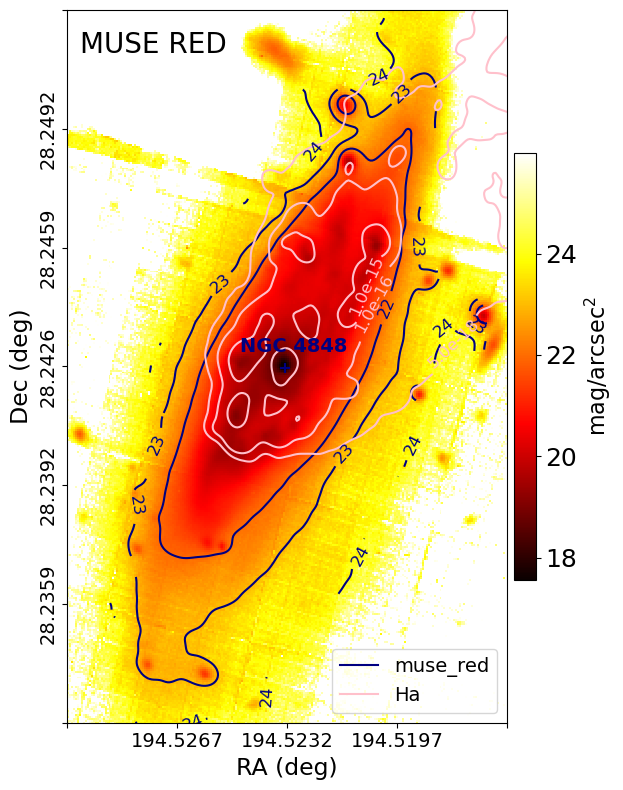

In [28]:
galaxy.plot( 
                
              # bands to plot. Can be just one
              bands = ['muse_red'],
              plots_per_row=1, # Number of plots for each row
              #figsize= (10,5)  
              
              auto_titles=True,            # Enables automatic titles
              auto_titles_style=0,         # Style of autotitle. Can be 0 or 1
              auto_title_fontsize=20,      # Fontsize of autotitle
              auto_title_color='black',    # color of autotitle font

              axis_label_fontsize=17,
              axis_ticks_fontsize=14,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=3,

              ra_min = ra_center-0.007,
              ra_max = ra_center+0.007,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.01,

              set_cmaps = {'muse_red':'hot_r'},

              contours = contours,
              points = points,

            )


# Photometry

Once the regions are defined we can do photometry on them

In [16]:
bands = ['galex_nuv','galex_fuv','sdss_u', 'sdss_g', 'sdss_r', 'sdss_i', 'sdss_z','hst_wfc3_uvis_f350lp','hst_wfc3_uvis_f600lp','spitzer_irac_1', 'spitzer_irac_2', 'spitzer_irac_3', 'spitzer_irac_4', 'herschel_pacs_70um', 'herschel_pacs_160um', 'herschel_pacs_100um']
#'wise_w1','wise_w2','wise_w3','wise_w4'
phot_list = galaxy.photometry(regions_for_mcspf,background_exclude_regions=[ellipses[-1]],bands = bands,print_output=True)



GALEX NUV
Region 1: total flux: 1.00625, poisson unc: 0.00378, sky flux: 0.02972, sky std: 0.003987660080986073
	Flux = 0.03554 ± 0.00168 mJy, SNR = 21.21
Region 2: total flux: 0.80422, poisson unc: 0.00327, sky flux: 0.07052, sky std: 0.009160438922625778
	Flux = 0.02670 ± 0.00128 mJy, SNR = 20.86
Region 3: total flux: 0.51419, poisson unc: 0.00244, sky flux: 0.10512, sky std: 0.012815596080494823
	Flux = 0.01489 ± 0.00083 mJy, SNR = 17.84
Region 4: total flux: 0.42236, poisson unc: 0.00203, sky flux: 0.14030, sky std: 0.016830508302023844
	Flux = 0.01026 ± 0.00078 mJy, SNR = 13.20


GALEX FUV
Region 1: total flux: 0.18549, poisson unc: 0.00247, sky flux: 0.00293, sky std: 0.001214205534515823
	Flux = 0.02104 ± 0.00102 mJy, SNR = 20.63
Region 2: total flux: 0.10954, poisson unc: 0.00185, sky flux: 0.00706, sky std: 0.0023000935737256907
	Flux = 0.01181 ± 0.00064 mJy, SNR = 18.40
Region 3: total flux: 0.05220, poisson unc: 0.00118, sky flux: 0.01051, sky std: 0.003283514473100001
	Flux

### PHOTOMETRY, BAND: galex_nuv ###
Units of output:  mJy
Mask number of pixels:  50
Mask weighted number of pixels:  28.346665778159945
Detected flux: 0.8042153809235137 counts/s
Poissonian Error 0.0034263873949330697 counts/s
Background: 0.06883032487612231 counts/s
Background std: 0.006662541893251158 counts/s
Sky subtracted flux: 0.7353850560473915 counts/s
Total Error 0.007491968703851008 counts/s
ZP 19.99751428005733 ± 0.05003145683606307
Flux in AB magnitudes = 20.3312  ± 0.0512
### Final value ### 
 Flux = 0.02676 ± 0.00126 mJy, SNR = 21.19




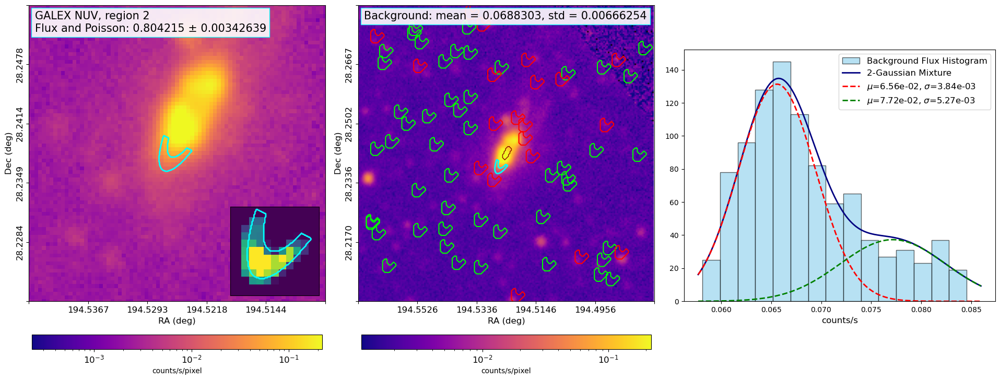

In [17]:
# Some diagnostics

galaxy.inspect_photometry(band='galex_nuv',
                          region=regions_for_mcspf[1],
                       background_exclude_regions=[ellipses[-1]],
                       threshold_quantile=0.8,
                       n_background_regions=1000,
                        N_background_gaussians=2,
                      region_plot_cmap='plasma',
                      background_plot_cmap='plasma')

In [18]:
# If we want to MANUALLY SET some values as upper limits

for i in range(4):
    for band in ['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um']:
        old_tuple = phot_list[i].data[band]
        new_tuple = (np.float64(0), old_tuple[0])
        phot_list[i].data[band] = new_tuple

In [ ]:
# saves the photometry table(s)

from pangal.photometry_table import PhotometryTable_to_fits, fits_to_PhotometryTable, print_photometric_tables
PhotometryTable_to_fits("../DATA/Coma/NGC4848/phot_tables_ngc4848.fits", phot_list)


Written 4 photometry table(s) to ../DATA/Coma/NGC4848/phot_tables_ngc4848.fits


In [ ]:
# Load the photometric table
phot_table = fits_to_PhotometryTable("../DATA/Coma/NGC4848/phot_tables_ngc4848.fits")

In [27]:
# View the photometric table
print_photometric_tables(phot_table)

,Region 1,Region 2,Region 3,Region 4
Band,,,,
GALEX NUV,0.036 ± 0.002 (21.2),0.027 ± 0.001 (20.9),0.015 ± 0.001 (17.8),0.010 ± 0.001 (13.2)
GALEX FUV,0.021 ± 0.001 (20.6),0.012 ± 0.001 (18.4),0.005 ± 0.000 (10.5),0.003 ± 0.001 (5.9)
SDSS u,0.107 ± 0.006 (18.0),0.068 ± 0.010 (6.9),0.047 ± 0.014 (3.4),0.011 ± 0.028 (0.4)
SDSS g,0.362 ± 0.005 (73.5),0.263 ± 0.007 (36.1),0.168 ± 0.010 (17.5),0.119 ± 0.013 (8.9)
SDSS r,0.542 ± 0.007 (73.5),0.440 ± 0.011 (41.6),0.290 ± 0.017 (17.4),0.202 ± 0.019 (10.9)
SDSS i,0.672 ± 0.009 (72.6),0.576 ± 0.020 (28.3),0.403 ± 0.027 (14.8),0.278 ± 0.033 (8.5)
SDSS z,0.804 ± 0.029 (27.8),0.692 ± 0.049 (14.2),0.528 ± 0.064 (8.2),0.383 ± 0.085 (4.5)
HST WFC3 UVIS F350LP,0.511 ± 0.007 (70.2),0.387 ± 0.009 (40.9),0.250 ± 0.014 (17.9),0.177 ± 0.017 (10.6)
HST WFC3 UVIS F600LP,0.736 ± 0.010 (70.2),0.590 ± 0.012 (48.9),0.385 ± 0.020 (19.2),0.265 ± 0.024 (10.9)


# Spectra from MUSE

In [30]:
spectra_mcspf = galaxy.cubes.muse.extract_spectra(regions_for_mcspf,pangal_object=galaxy)
for i, spec in enumerate(spectra_mcspf):
    spec.header['ID'] = f'NGC 4848 region {i+1}'

# Filters

Each band stored in a PanGal object contains a Filter object 
To plot the filters transmission curves:

In [ ]:
sdss_r_filter_obj = galaxy.images.sdss_r.filter

print(sdss_r_filter_obj.pivot_wavelength)
# print(sdss_r_filter_obj.effective_wavelength(F)) this needs a spectrum as imput

6175.592568560198


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:4                                                                                    │
│                                                                                                  │
│   1 sdss_r_filter_obj = galaxy.images.sdss_r.filter                                              │
│   2                                                                                              │
│   3 print(sdss_r_filter_obj.pivot_wavelength)                                                    │
│ ❱ 4 print(sdss_r_filter_obj.effective_wavelength)                                                │
│   5                                                                                              │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
TypeError: Filter.effective_wavelength() missing 1 required positional argument: 'F'

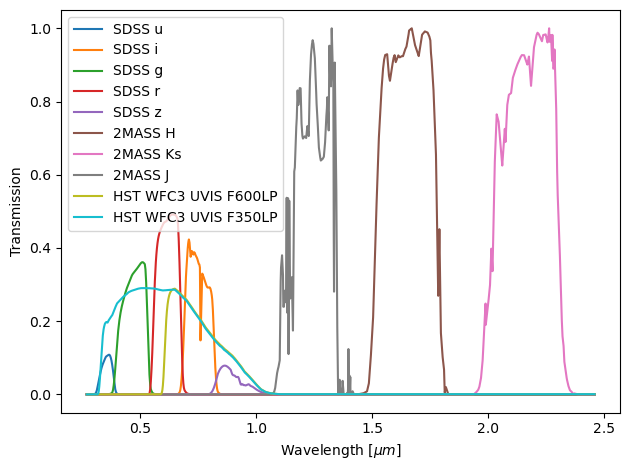

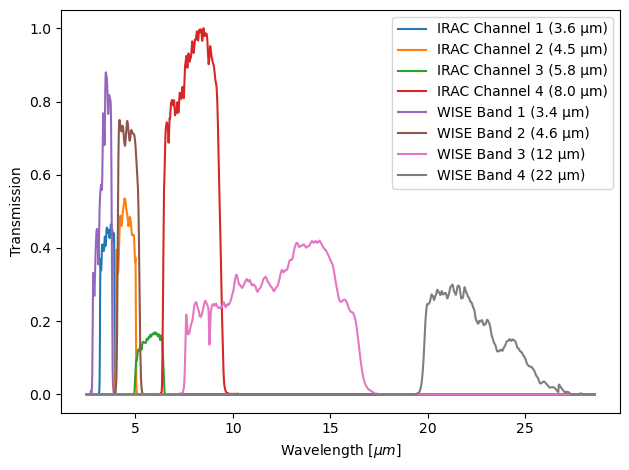

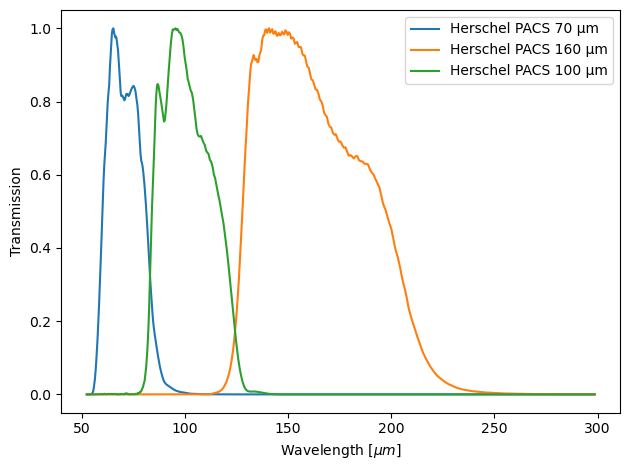

In [24]:
galaxy.plot_filters(filters=['sdss_u', 'sdss_i', 'sdss_g', 'sdss_r', 'sdss_z', '2mass_h', '2mass_ks', '2mass_j', 'hst_wfc3_uvis_f600lp', 'hst_wfc3_uvis_f350lp'])

galaxy.plot_filters(filters=['spitzer_irac_1', 'spitzer_irac_2', 'spitzer_irac_3', 'spitzer_irac_4', 'wise_w1', 'wise_w2', 'wise_w3', 'wise_w4'])

galaxy.plot_filters(filters=['herschel_pacs_70um', 'herschel_pacs_160um', 'herschel_pacs_100um',])

In [13]:
from pangal.data.spectral_lines import spectral_lines, atmospheric_lines
#print(spectral_lines)
print(atmospheric_lines)

{'O₂ A-band': 7605, 'O₂ B-band': 6870, 'O₂ γ-band': 6280, '[O I] 5577': 5577, '[O I] 6300': 6300, '[O I] 6364': 6364, 'NaI D1': 5890, 'NaI D2': 5896}


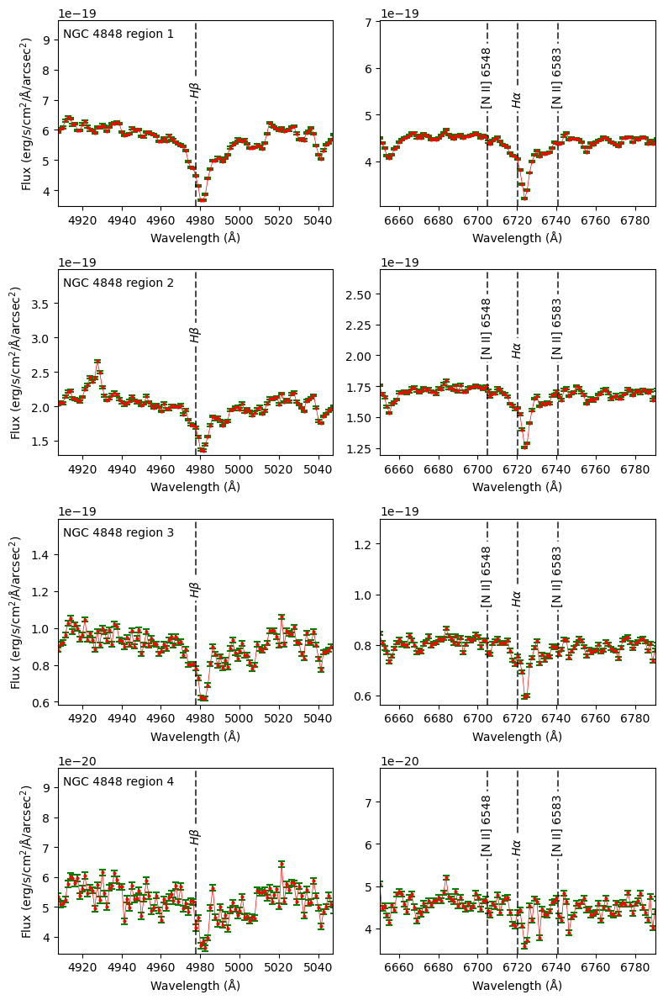

In [70]:
galaxy.plot_spectra(spectra_mcspf,zoom_on_line=['Hb','Ha'],z=z_true,
             show_spectral_lines=True,show_atmospheric_lines=True,)

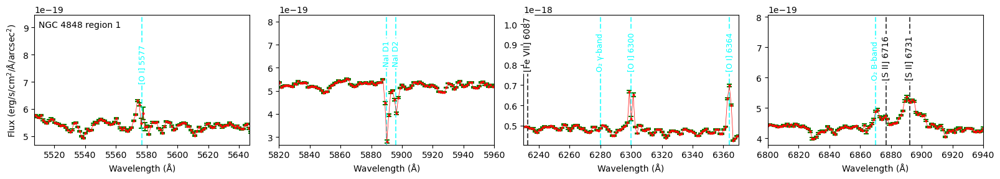

In [16]:
galaxy.plot_spectra(spectra_mcspf[0],zoom_on_line=['[O I] 5577','NaI D1','[O I] 6300','O₂ B-band'],z=z_true,
             show_spectral_lines=True,show_atmospheric_lines=True,)



In [19]:
w = spectra_mcspf[0].wl
mask_atmospheric_lines = (
    ((w >= 5565) & (w <= 5585)) |
    ((w >= 5880) & (w <= 5910)) |
    ((w >= 6275) & (w <= 6375)) |
    ((w >= 6860) & (w <= 6890))
)
        
for spec in spectra_mcspf:
    spec.flux[mask_atmospheric_lines] = 0
    #spec.flux_err[mask_atmospheric_lines] = 0

In [22]:
nrows = len(regions_for_mcspf)

ID = [i + 1 for i in range(nrows)]
z_best = [z_true for _ in range(nrows)]
dl = [distance for _ in range(nrows)]
polymax = [7 for _ in range(nrows)]
spec_lim = ['4000,7000' for _ in range(nrows)]
res_file = ['Extracted_resolution.fits' for _ in range(nrows)]

columns = []
columns.append(fits.Column(name='id', format='K', array=np.array(ID, dtype='int64')))
columns.append(fits.Column(name='z_best', format='D', array=np.array(z_best)))
columns.append(fits.Column(name='dl', format='D', array=np.array(dl)))
columns.append(fits.Column(name='polymax', format='J', array=np.array(polymax, dtype='int32')))
columns.append(fits.Column(name='spec_file', format='93A', array=[''] * nrows))  # Optional if not used
columns.append(fits.Column(name='spec_lim', format='9A', array=np.array(spec_lim)))
columns.append(fits.Column(name='res_file', format='72A', array=np.array(res_file)))

for band in phot_list[0].data.keys():
    columns.append(fits.Column(name='f_' + band, format='D', array=np.zeros(nrows)))
    columns.append(fits.Column(name='e_' + band, format='D', array=np.zeros(nrows)))

# Create the HDU
coldefs = fits.ColDefs(columns)
hdu = fits.BinTableHDU.from_columns(coldefs)

# Fill in photometry
for i in range(nrows):
    for band in phot_list[i].data.keys():
        hdu.data[i]['f_' + band] = phot_list[i].data[band][0]
        hdu.data[i]['e_' + band] = phot_list[i].data[band][1]

spec_filepath = '../DATA/Coma/NGC4848/'
for i,spec in enumerate(spectra_mcspf):
    w = spec.wl
    flux = spec.flux
    err = spec.flux_err

    # Create the fits file:
    primary_hdu = fits.PrimaryHDU(flux/1e-20)
    hdu_error = fits.ImageHDU(err/1e-20)
    hdu_wavelength = fits.ImageHDU(w)
    # Combine into HDUList
    hdul = fits.HDUList([primary_hdu, hdu_error, hdu_wavelength])

    # Write to file
    output_file = '../DATA/Coma/NGC4848/MUSE_spec_region_'+str(i)+'.fits'
    hdul.writeto(output_file, overwrite=True)

    hdu.data[i]['spec_file'] = 'MUSE_spec_region_'+str(i)+'.fits'


print(hdu.data[1])


# Assume your BinTableHDU is called `bintable_hdu`
primary_hdu = fits.PrimaryHDU()  # Empty primary header
hdul = fits.HDUList([primary_hdu, hdu])

hdul.writeto('../DATA/Coma/NGC4848/phot_spec_file_mcspf_herschel_upp_lim.fits', overwrite=True)

(2, 0.023974, 104.0, 7, 'MUSE_spec_region_1.fits', '4000,7000', 'Extracted_resolution.fits', 0.026700807991329213, 0.0012832172129436364, 0.011802048956932017, 0.0006349660379854362, 0.06780780253124777, 0.01119458627434482, 0.2632508515709374, 0.006339206960076735, 0.44034374285524175, 0.010207152639820131, 0.5782511667113357, 0.018640436645307804, 0.6973057182935063, 0.03785700460410707, 0.38733917891402486, 0.00951223359638005, 0.5904591231694587, 0.011797373764020892, 0.4668092433108697, 0.011169057877405394, 0.2939624298824159, 0.01269697051365088, 0.28862308023941263, 0.03776957180633166, 0.3830656486536847, 0.04595600665981196, 0.0, 6.408413020043138, 0.0, 10.104018276188201, 0.0, 9.140905808061136)


In [11]:
# 70 µm (blue band): Approximately 5.4″. 100 µm (green band): Approximately 6.1″. 160 µm (red band): Approximately 9.9″

psf_galex = []
for res_arcsec,color,target in zip([4.2,5.3],['purple','pink'],['galex_fuv','galex_nuv']):
    res_deg = res_arcsec / 3600

    psf_galex.append(Region(sky_region='Circle',wcs=galaxy.images.muse_red.wcs,image_shape=galaxy.images.muse_red.image.shape,
                     ra_center=ra_center,dec_center=dec_center,radius=res_deg,color=color,linewidth=5,target_bands=[target]))

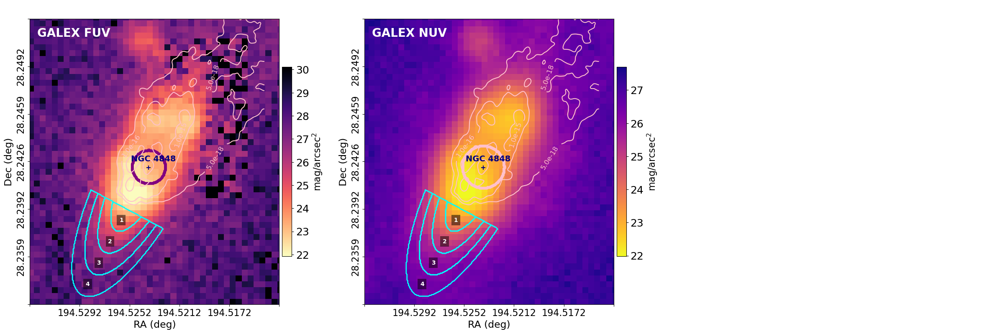

In [ ]:
galaxy.plot( plots_per_row=2,
            
              bands=['galex_fuv','galex_nuv'],
              #figsize= (10,5),
              auto_titles=True,
              auto_titles_style=1,
              auto_title_fontsize=20,
              auto_title_color='white',
              ra_min = ra_center-0.01,
              ra_max = ra_center+0.01,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.01,
              regions= regions_for_mcspf + psf_galex,
              contours=[contours[1]],
              points = points,
              axis_label_fontsize=17,
              axis_ticks_fontsize=16,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,
              set_cmaps = {'galex_nuv':'plasma',
                           'galex_fuv':'magma',
                           'spitzer_irac_1':'bone',
                           'spitzer_irac_2':'pink',
                           'spitzer_irac_3':'copper',
                           'spitzer_irac_4':'gist_heat',
                           'herschel_pacs_70um':'GnBu_r',
                           'herschel_pacs_100um':'YlGn_r',
                           'herschel_pacs_160um':'OrRd_r',
                          },
              
              set_scale_lims = {#'galex_nuv':(22,27),
                                #'galex_fuv':(22,27),
                                'spitzer_irac_3':(1,10),
                                'spitzer_irac_4':(1,15),
                                'herschel_pacs_70um':(1,200),
                                'herschel_pacs_100um':(1,200),
                                'herschel_pacs_160um':(1,200),
                               
                               },
              show_region_captions=True,
              legend=False
            )

In [14]:
# 70 µm (blue band): Approximately 5.4″. 100 µm (green band): Approximately 6.1″. 160 µm (red band): Approximately 9.9″

psf_pacs = []
for res_arcsec,color,target in zip([5.4,6.1,9.9],['blue','green','darkred'],['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um']):
    res_deg = res_arcsec / 3600

    psf_pacs.append(Region(sky_region='Circle',wcs=galaxy.images.muse_red.wcs,image_shape=galaxy.images.muse_red.image.shape,
                     ra_center=ra_center,dec_center=dec_center,radius=res_deg,color=color,linewidth=5,target_bands=[target]))
    

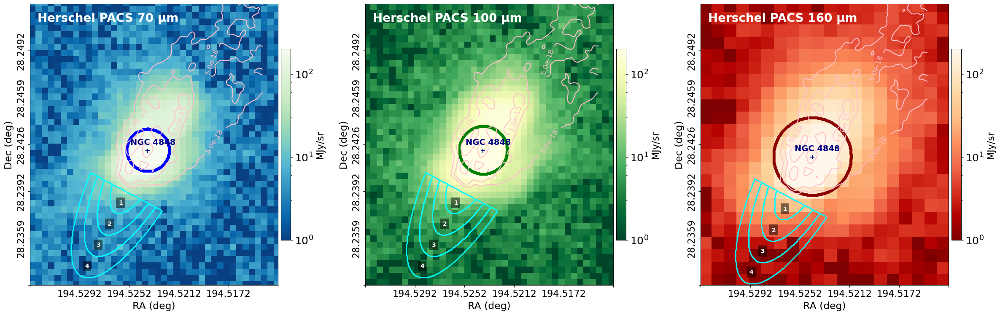

In [16]:
galaxy.plot( plots_per_row=3,
            
              bands=['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
              #figsize= (10,5),
              auto_titles=True,
              auto_titles_style=1,
              auto_title_fontsize=20,
              auto_title_color='white',
              ra_min = ra_center-0.01,
              ra_max = ra_center+0.01,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.01,
              regions= regions_for_mcspf + psf_pacs,
              contours=[contours[1]],
              points = points,
              axis_label_fontsize=17,
              axis_ticks_fontsize=16,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,
              set_cmaps = {'galex_nuv':'plasma',
                           'galex_fuv':'magma',
                           'spitzer_irac_1':'bone',
                           'spitzer_irac_2':'pink',
                           'spitzer_irac_3':'copper',
                           'spitzer_irac_4':'gist_heat',
                           'herschel_pacs_70um':'GnBu_r',
                           'herschel_pacs_100um':'YlGn_r',
                           'herschel_pacs_160um':'OrRd_r',
                          },
              
              set_scale_lims = {#'galex_nuv':(22,27),
                                #'galex_fuv':(22,27),
                                'spitzer_irac_3':(1,10),
                                'spitzer_irac_4':(1,15),
                                'herschel_pacs_70um':(1,200),
                                'herschel_pacs_100um':(1,200),
                                'herschel_pacs_160um':(1,200),
                               
                               },
              show_region_captions=True,
              legend=False
            )

### PHOTOMETRY, BAND: galex_nuv ###
Units of output:  mJy
Mask number of pixels:  50
Mask weighted number of pixels:  28.346665778159945
Detected flux: 0.8042153809235137 counts/s
Poissonian Error 0.0034263873949330697 counts/s
Background: 0.06883050217758815 counts/s
Background std: 0.006215214500393269 counts/s
Sky subtracted flux: 0.7353848787459256 counts/s
Total Error 0.0070971136292196264 counts/s
ZP 19.99751428005733 ± 0.05003145683606307
Flux in AB magnitudes = 20.3312  ± 0.0512
### Final value ### 
 Flux = 0.02676 ± 0.00126 mJy, SNR = 21.21




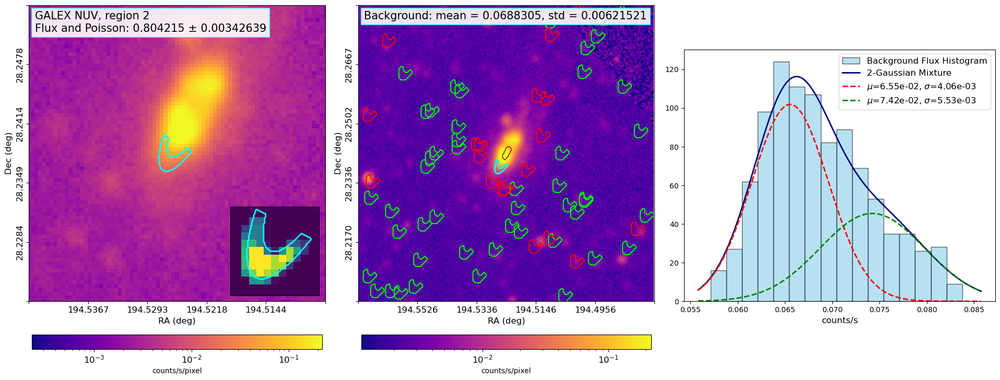

In [7]:
galaxy.inspect_photometry(band='galex_nuv',
                          region=regions_for_mcspf[1],
                          ackground_exclude_regions=[ellipses[-1]],
                          threshold_quantile=0.8,
                          n_background_regions=1000,
                        N_background_gaussians=2,
                      region_plot_cmap='plasma',
                      background_plot_cmap='plasma')

### PHOTOMETRY, BAND: sdss_r ###
Units of output:  mJy
Mask number of pixels:  514
Mask weighted number of pixels:  476.3628849592851
Detected flux: 22723.966382525574 counts/s
Poissonian Error 20.531356807277824 counts/s
Background: 181.13844357628068 counts/s
Background std: 346.0508133360906 counts/s
Sky subtracted flux: 22542.827938949293 counts/s
Total Error 346.6593457890867 counts/s
ZP 28.17040723193997 ± 0.010013956734771089
Flux in AB magnitudes = 17.2879  ± 0.0195
### Final value ### 
 Flux = 0.44141 ± 0.00792 mJy, SNR = 55.77




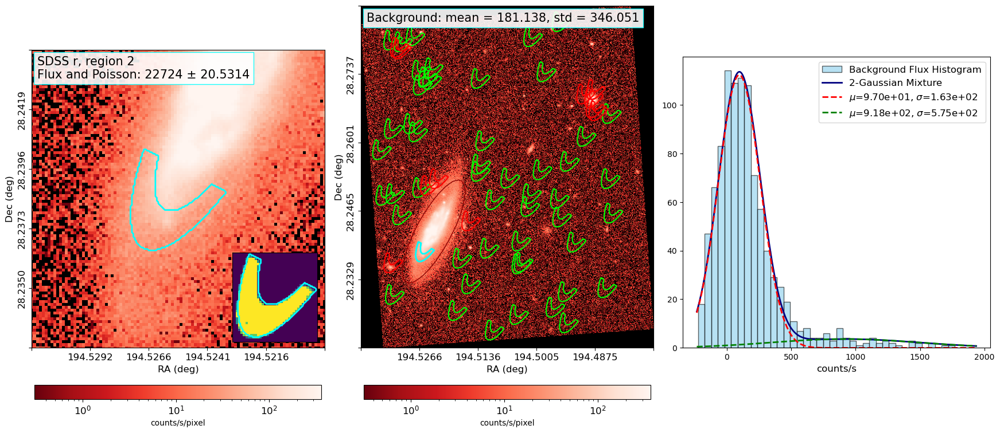

In [8]:

galaxy.inspect_photometry(band='sdss_r',
                          region=regions_for_mcspf[1],
                       background_exclude_regions=[ellipses[1]],
                       threshold_quantile=0.8,
                       n_background_regions=1000,
                        N_background_gaussians=2,
                      region_plot_cmap='Reds_r',
                      background_plot_cmap='Reds_r')


### PHOTOMETRY, BAND: spitzer_irac_1 ###
Units of output:  mJy
Mask number of pixels:  480
Mask weighted number of pixels:  407.7774746675774
Detected flux: 1789.3183125827916 counts/s
Poissonian Error 8.171022498957054 counts/s
Background: 797.8284254599661 counts/s
Background std: 45.669259672075015 counts/s
Sky subtracted flux: 991.4898871228255 counts/s
Total Error 46.39447044286506 counts/s
ZP 25.3052071539271 ± 0.011
Flux in AB magnitudes = 17.8145  ± 0.0520
### Final value ### 
 Flux = 0.27177 ± 0.01301 mJy, SNR = 20.89




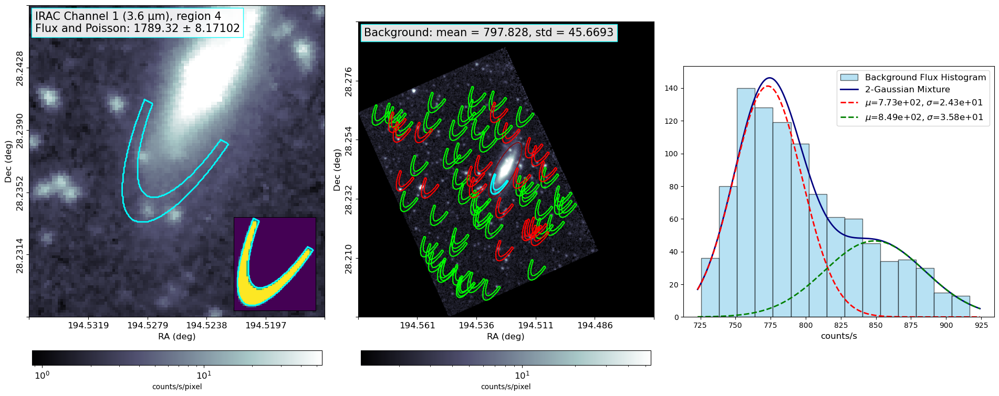

In [9]:
galaxy.inspect_photometry(band='spitzer_irac_1',
                          region=regions_for_mcspf[i],
                       background_exclude_regions=[ellipses[1]],
                       threshold_quantile=0.8,
                       n_background_regions=1000,
                        N_background_gaussians=2,
                      region_plot_cmap='bone',
                      background_plot_cmap='bone')

### PHOTOMETRY, BAND: herschel_pacs_100um ###
Units of output:  mJy
Mask number of pixels:  95
Mask weighted number of pixels:  48.78124931357862
Detected flux: 0.009633959726155205 mJy
Poissonian Error 0 mJy
Background: 0.005685713242516762 mJy
Background std: 0.0025823914238696623 mJy
Sky subtracted flux: 0.0039482464836384425 mJy
Total Error 0.0025823914238696623 mJy
ZP 8.9 ± 0
Flux in AB magnitudes = 14.9090  ± 0.7101
### Final value ### 
 Flux = 3.94825 ± 2.58239 mJy, SNR = 1.53




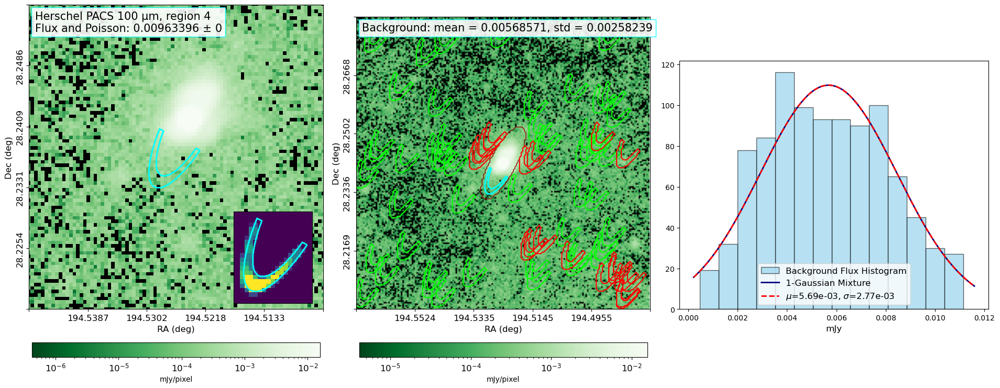

In [10]:
galaxy.inspect_photometry(band='herschel_pacs_100um',
                          region=regions_for_mcspf[i],
                       background_exclude_regions=[ellipses[1]],
                       threshold_quantile=0.8,
                       n_background_regions=1000,
                        N_background_gaussians=1,
                      region_plot_cmap='Greens_r',
                      background_plot_cmap='Greens_r')

In [3]:
# BUILD MODELS

In [2]:
from pangal.model_builders.boissier import M, Md, Rd, Sigma_0, surface_density, Vc_to_Md, Md_to_Vc, Rc, rho_0
from pangal.model_builders.boissier import velocity_profile, boissier_unperturbed, boissier_quenched, read_boissier_quenched_fits
from itertools import product

In [17]:
"""
SFH_QUENCHING_TAU    = [2,8,12,16,20,28,30,35,40,45,50,75,100,125,150,175,200,250,300,400,500,1000]
SFH_QUENCHING_AGE    = [10,20,30,40,50,60,70,80,90,100,120,140,160,180,200,240,280,300,350,400,450,500,550,600,650,700,800,900,1000]

metallicity          = [0.008] #, 0.017, 0.030]
radii                = [7.5], #10.5,13.5,16.5]

for r, z in product(radii, metallicity):

    z_str = f"{int(z*1000):03d}"

    my_quenched_models = boissier_quenched(V=160,R=r,
                                           sfh_quenching_tau=SFH_QUENCHING_TAU,sfh_quenching_age=SFH_QUENCHING_AGE,
                                           metallicity=0.02,
                                           stellar_library='cb19',
                                          filename=f'V_160_R_{r}_met_{z_str}.fits')
"""

'\nSFH_QUENCHING_TAU    = [2,8,12,16,20,28,30,35,40,45,50,75,100,125,150,175,200,250,300,400,500,1000]\nSFH_QUENCHING_AGE    = [10,20,30,40,50,60,70,80,90,100,120,140,160,180,200,240,280,300,350,400,450,500,550,600,650,700,800,900,1000]\n\nmetallicity          = [0.008] #, 0.017, 0.030]\nradii                = [7.5], #10.5,13.5,16.5]\n\nfor r, z in product(radii, metallicity):\n\n    z_str = f"{int(z*1000):03d}"\n\n    my_quenched_models = boissier_quenched(V=160,R=r,\n                                           sfh_quenching_tau=SFH_QUENCHING_TAU,sfh_quenching_age=SFH_QUENCHING_AGE,\n                                           metallicity=0.02,\n                                           stellar_library=\'cb19\',\n                                          filename=f\'V_160_R_{r}_met_{z_str}.fits\')\n'

In [78]:
from pangal.read_write import PhotometryTable_to_fits
from pangal.read_write import fits_to_PhotometryTable

PhotometryTable_to_fits(tables=phot_list,filename="NGC4848_phot_list.fits")


Written 4 photometry table(s) to NGC4848_phot_list.fits


In [80]:
phot_list = fits_to_PhotometryTable("NGC4848_phot_list.fits")
phot_list[0].header['REDSHIFT'] = z_true

In [84]:
phot_list[0].df

,Value,Error,SNR
Band,,,
galex_nuv,0.039913,0.001882,21.207448
galex_fuv,0.023489,0.001131,20.766624
sdss_u,0.107538,0.006152,17.480990
sdss_i,0.665000,0.009076,73.269008
sdss_g,0.360385,0.004906,73.457630
sdss_r,0.543640,0.007396,73.508088
sdss_z,0.807140,0.030565,26.406975
hst_wfc3_uvis_f350lp,0.511332,0.007284,70.201006
hst_wfc3_uvis_f600lp,0.735616,0.010476,70.221688


In [28]:
import pandas as pd
import math

fits_values = {}
for z in ['008','017','030']:
    filename = f"../DATA/Coma/NGC4848/Z_{z}/Plots/Fit_values.txt"
    
    # Read the file into a DataFrame
    df = pd.read_csv(filename, delim_whitespace=True)
    
    # Normalize the ID column
    if "#ID" in df.columns:
        df = df.rename(columns={"#ID": "ID"})
    
    # Make sure ID is int
    df["ID"] = df["ID"].astype(int)
    
    df.replace({"nan": math.nan}, inplace=True)
    
    fits_values[z] = [dict(zip(df.columns, row)) for row in df.values]



In [29]:
print(fits_values['017'][0])

{'ID': 1.0, 'TRUNCTAU_16': 18.444, 'TRUNCTAU_50': 19.728, 'TRUNCTAU_84': 20.779, 'TRUNCAGE_16': 99.599, 'TRUNCAGE_50': 105.24, 'TRUNCAGE_84': 110.754, 'AV_16': 0.074, 'AV_50': 0.08, 'AV_84': 0.087, 'AV_EXTRA_16': 0.087, 'AV_EXTRA_50': 0.094, 'AV_EXTRA_84': 0.101, 'DALE_ALPHA_16': 2.244, 'DALE_ALPHA_50': 2.354, 'DALE_ALPHA_84': 2.489, 'LMSTAR_16': 9.001, 'LMSTAR_50': 9.004, 'LMSTAR_84': 9.008, 'SIGMA_16': 59.734, 'SIGMA_50': 64.166, 'SIGMA_84': 68.498, 'VEL_16': 93.051, 'VEL_50': 96.826, 'VEL_84': 100.546, 'SIGMA_GAS_16': 181.004, 'SIGMA_GAS_50': 192.535, 'SIGMA_GAS_84': 198.025, 'AGE_GAS_16': 0.746, 'AGE_GAS_50': 3.997, 'AGE_GAS_84': 4.859, 'ION_GAS_16': -3.985, 'ION_GAS_50': -3.942, 'ION_GAS_84': -3.854, 'FESC_16': -0.008, 'FESC_50': -0.004, 'FESC_84': -0.0, 'LNF1_16': 1.999, 'LNF1_50': 2.0, 'LNF1_84': 2.0, 'LNF2_16': -1.361, 'LNF2_50': -0.015, 'LNF2_84': 1.338, 'LSFR_16': nan, 'LSFR_50': nan, 'LSFR_84': nan, 'ZSPS': 0.024, 'NDET': 16.0, 'NBANDS': 16.0, 'LNZ': 1684.42, 'CHI2_PHOT': 39

Text(0.5, 1.0, 'Dust emission')

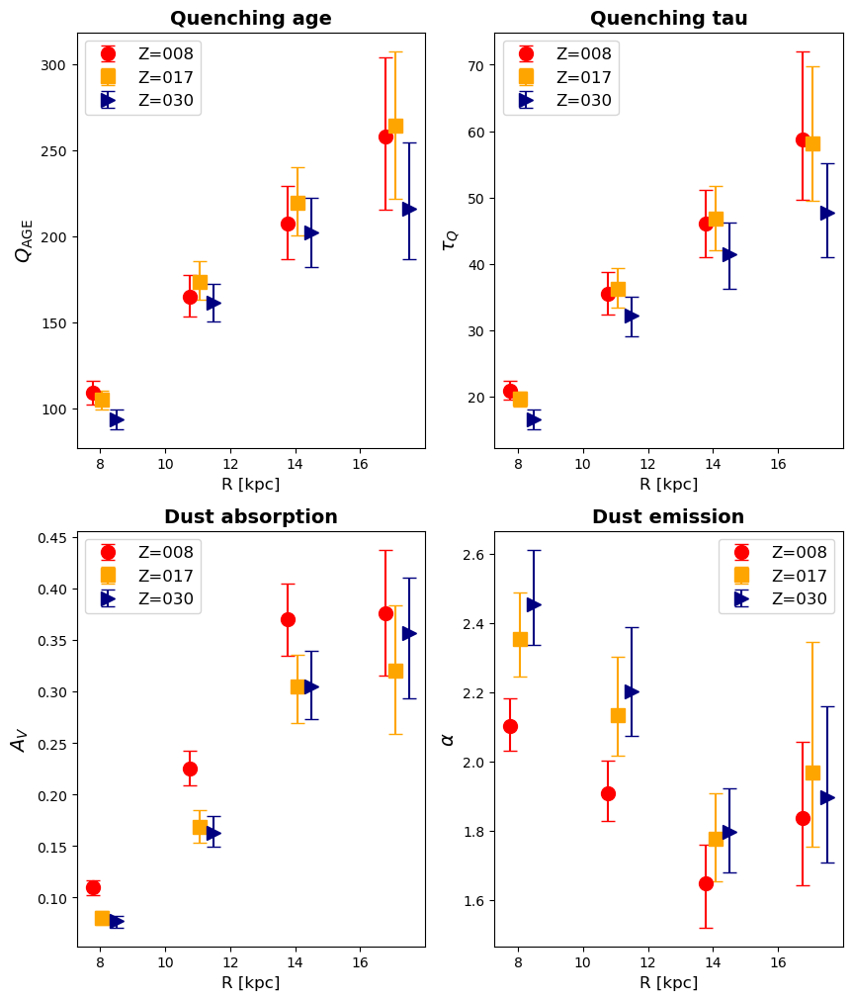

In [22]:


from pangal.model_builders.boissier import M, Md, Rd, Sigma_0, surface_density, Vc_to_Md, Md_to_Vc, Rc, rho_0
from pangal.model_builders.boissier import velocity_profile, boissier_unperturbed, boissier_quenched, read_boissier_quenched_fits


In [94]:
from pangal.base import Spectrum

def read_boissier_quenched_fits(filename):
    """
    Returns:
        list of Spectrum: List of Spectrum objects matching those produced by boissier_quenched().
    """
    with fits.open(filename) as hdul:

        primary = hdul[0]  

        # My models!
        if len(primary.data.shape) > 1:

            #primary = hdul[0]    
            
            wl = primary.data[0]
            resolution = primary.data[1]

            n_models = primary.header.get('NEXT', len(hdul) - 1)
    
            models = []
    
            for i in range(1, n_models + 1):
                hdu = hdul[i]
                flux_y = hdu.data[:, 0]
                flux_o = hdu.data[:, 1]
                total_flux = flux_y + flux_o
    
                spec = Spectrum(
                    wl=wl,
                    resolution=resolution,
                    flux=total_flux
                )
                spec.flux_young = flux_y
                spec.flux_old = flux_o
    
                spec.header = {
                    'sfh': primary.header.get('SFHFUNC'),
                    'starlib': primary.header.get('starlib'),
                    'metal': hdu.header.get('METAL'),
                    'truncage': hdu.header.get('TRUNCAGE'),
                    'trunctau': hdu.header.get('TRUNCTAU'),
                    'age': hdu.header.get('AGE')
                }
      
                models.append(spec)


        
        # Fossati models        ASSUMING cb19!!     
        else:

            #primary = hdul[0]  

            wl = primary.data
            delta_lambda = np.full_like(wl, 2.0)
            delta_lambda[(wl >= 912) & (wl <= 3540)] = 1.0
            delta_lambda[(wl >= 3540) & (wl <= 7350)] = 2.5
            delta_lambda[(wl >= 7350) & (wl <= 9400)] = 1.0
            resolution = wl/delta_lambda
            
                
            n_models = primary.header.get('NEXT', len(hdul) - 1)
    
            models = []
    
            for i in range(1, n_models + 1):
                hdu = hdul[i]
                flux = hdu.data[:, 0]
                young_faction = hdu.data[:, 1]
                flux_y = flux * young_faction
                flux_o = flux * (1-young_faction)
                total_flux = flux_y + flux_o
    
                spec = Spectrum(
                    wl=wl,
                    resolution=resolution,
                    flux=total_flux
                )
                spec.flux_young = flux_y
                spec.flux_old = flux_o
    
                spec.header = {
                    'sfh': primary.header.get('SFHFUNC'),
                    'starlib': primary.header.get('starlib'),
                    'metal': hdu.header.get('METAL'),
                    'truncage': hdu.header.get('TRUNCAGE'),
                    'trunctau': hdu.header.get('TRUNCTAU'),
                    'age': hdu.header.get('AGE')
                }


            models.append(spec)

    return models

In [95]:
my_quenched_models = read_boissier_quenched_fits('../DATA/new_models/V_100_R_11_Z_017.fits')

In [96]:
my_quenched_models[0].resolution

array([2.80000e+00, 3.25000e+00, 3.70000e+00, ..., 7.07925e+05,
       7.52555e+05, 8.00000e+05], dtype=float32)

In [97]:
fitter = PFitter(my_quenched_models,model_pars=['truncage','trunctau'])

Loading nebular lines templates from  nebular_Byler_mist_2018.lines
 Emission line metallicity requested 0.0017, found 0.0020
Tabulated values for ionized gas age (Myr): [ 0.5  1.   2.   3.   4.   5.   6.   7.  10. ]
Tabulated values for ionization coefficient: [-4.  -3.5 -3.  -2.5 -2.  -1.5 -1. ]
Loading of nebular lines templates completed.
Tabulated alpha values from 'alpha_dh02.dat': [0.0625 0.125  0.1875 0.25   0.3125 0.375  0.4375 0.5    0.5625 0.625
 0.6875 0.75   0.8125 0.875  0.9375 1.     1.0625 1.125  1.1875 1.25
 1.3125 1.375  1.4375 1.5    1.5625 1.625  1.6875 1.75   1.8125 1.875
 1.9375 2.     2.0625 2.125  2.1875 2.25   2.3125 2.375  2.4375 2.5
 2.5625 2.625  2.6875 2.75   2.8125 2.875  2.9375 3.     3.0625 3.125
 3.1875 3.25   3.3125 3.375  3.4375 3.5    3.5625 3.625  3.6875 3.75
 3.8125 3.875  3.9375 4.    ]
Loading of dust emission templates completed.


In [117]:
fits_values['017'][0]

{'ID': 1.0,
 'TRUNCTAU_16': 18.444,
 'TRUNCTAU_50': 19.728,
 'TRUNCTAU_84': 20.779,
 'TRUNCAGE_16': 99.599,
 'TRUNCAGE_50': 105.24,
 'TRUNCAGE_84': 110.754,
 'AV_16': 0.074,
 'AV_50': 0.08,
 'AV_84': 0.087,
 'AV_EXTRA_16': 0.087,
 'AV_EXTRA_50': 0.094,
 'AV_EXTRA_84': 0.101,
 'DALE_ALPHA_16': 2.244,
 'DALE_ALPHA_50': 2.354,
 'DALE_ALPHA_84': 2.489,
 'LMSTAR_16': 9.001,
 'LMSTAR_50': 9.004,
 'LMSTAR_84': 9.008,
 'SIGMA_16': 59.734,
 'SIGMA_50': 64.166,
 'SIGMA_84': 68.498,
 'VEL_16': 93.051,
 'VEL_50': 96.826,
 'VEL_84': 100.546,
 'SIGMA_GAS_16': 181.004,
 'SIGMA_GAS_50': 192.535,
 'SIGMA_GAS_84': 198.025,
 'AGE_GAS_16': 0.746,
 'AGE_GAS_50': 3.997,
 'AGE_GAS_84': 4.859,
 'ION_GAS_16': -3.985,
 'ION_GAS_50': -3.942,
 'ION_GAS_84': -3.854,
 'FESC_16': -0.008,
 'FESC_50': -0.004,
 'FESC_84': -0.0,
 'LNF1_16': 1.999,
 'LNF1_50': 2.0,
 'LNF1_84': 2.0,
 'LNF2_16': -1.361,
 'LNF2_50': -0.015,
 'LNF2_84': 1.338,
 'LSFR_16': nan,
 'LSFR_50': nan,
 'LSFR_84': nan,
 'ZSPS': 0.024,
 'NDET': 16.0,


In [142]:
import pandas as pd
import math
from pprint import pprint

fits_values = {}
for z in ['008','017','030']:
    filename = f"../DATA/Coma/NGC4848/Z_{z}/Plots/Fit_values.txt"
    
    # Read the file into a DataFrame
    df = pd.read_csv(filename, delim_whitespace=True)
    
    # Normalize the ID column
    if "#ID" in df.columns:
        df = df.rename(columns={"#ID": "ID"})
    
    # Make sure ID is int
    df["ID"] = df["ID"].astype(int)
    
    df.replace({"nan": math.nan}, inplace=True)
    
    fits_values[z] = [dict(zip(df.columns, row)) for row in df.values]



# Choose z
z = '030'
region_spec = []
for i in range(4):

    spec = fitter.synthetic_spectrum(
        multi_component=True,
        trunctau=fits_values[z][i]['TRUNCTAU_50'],
        truncage=fits_values[z][i]['TRUNCAGE_50'],
        fesc=fits_values[z][i]['FESC_50'],
        av=fits_values[z][i]['AV_50'],
        av_ext=fits_values[z][i]['AV_EXTRA_50'],
        alpha=fits_values[z][i]['DALE_ALPHA_50'],
        m_star=fits_values[z][i]['LMSTAR_50'],
        ion_gas=fits_values[z][i]['ION_GAS_50'],
        age_gas=fits_values[z][i]['AGE_GAS_50'],
        redshift=z_true,
        dl=distance  # Luminosity distance in Mpc (assumed)
    )

region_spec.append(spec)




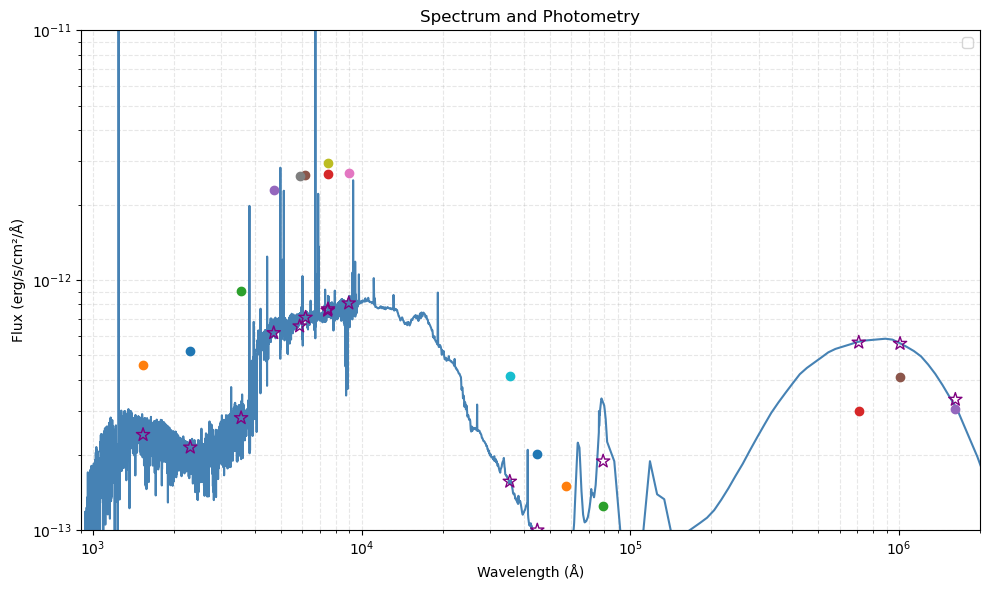

In [143]:
# Plot
plt.figure(figsize=(10,6))

from pangal.filters import map_filter_names, Filter
# Convert mJy → erg/s/cm²/Å
# 1 mJy = 1e-26 W/m²/Hz = 1e-23 erg/s/cm²/Hz
# Using f_lambda = f_nu * c / λ²

i = 0

for key in phot_list[i].data.keys():
    if key in map_filter_names.keys() and 'muse' not in key:


        phot_wl = Filter(key).pivot_wavelength
        phot_mjy = phot_list[i].data[key][0]
        
        phot_fnu = phot_mjy * 1e-26 #* 1e7  # → erg/s/cm²/Hz
        phot_flux = phot_fnu * 2.99e18 / (phot_wl**2)  # → erg/s/cm²/Å

        plt.scatter(phot_wl, phot_flux*phot_wl,zorder=5)

        synth_phot = np.array(fitter.synthetic_phot(region_spec[i],bands=[key])) / ( phot_wl**2 / 3.99e18 / 1e-26) * phot_wl 
        
        plt.scatter(phot_wl, synth_phot, marker='*', s=100, facecolors='none', edgecolors='purple',zorder=10)


        

spectrum = region_spec[i]
plt.plot(spectrum.wl, spectrum.flux*spectrum.wl, lw=1.5, color='steelblue')
#plt.plot(spectrum.wl, spectrum.dust*spectrum.wl, lw=1.5, color='darkred')
#plt.plot(spectrum.wl, spectrum.young_stellar_emm*spectrum.wl, lw=1.5, color='lime')
#plt.plot(spectrum.wl, spectrum.att_old_stellar_emm*spectrum.wl, lw=1.5, color='cyan')


plt.xlim(900,200e4)
plt.ylim(1e-13, 1e-11) #1e-2*np.nanmax(spectrum.flux)

plt.xlabel("Wavelength (Å)")
plt.ylabel("Flux (erg/s/cm²/Å)")
plt.yscale("log")
plt.xscale("log")
plt.legend()
plt.title("Spectrum and Photometry")
plt.grid(True, which='both', ls='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [13]:
#fix_pars={'fesc':1,'ion_gas':0,'age_gas':0},
#phot_list[0].print

In [21]:
res = fitter.run_fit(spec= None,phot=phot_list[0],fix_pars={'ion_gas':-20,'age_gas':-1},
                     bands=['sdss_u', 'sdss_i', 'sdss_g', 'sdss_r', 'sdss_z', 'spitzer_irac_2','spitzer_irac_1', 'spitzer_irac_4','spitzer_irac_3', 'herschel_pacs_70um', 'herschel_pacs_160um', 'herschel_pacs_100um'],
                     polymax=7,nlive=10)



Using the following photometric filters: sdss_u, sdss_i, sdss_g, sdss_r, sdss_z, spitzer_irac_2, spitzer_irac_1, spitzer_irac_4, spitzer_irac_3, herschel_pacs_70um, herschel_pacs_160um, herschel_pacs_100um
Initializing live points
CHIAMA:  [4.86618068e+02 8.39243830e+02 5.20163217e-01 4.35779611e-01
 6.73615576e-01 1.83358245e+00 1.04148449e+01]
[  -0.73931104   -4.69930433   -2.20629946   -3.46077224   -6.02708927
   -3.71541213   -5.00826201  -15.30663816   -4.70886819 -466.72155831
 -537.58337343 -612.39927561]
[4.86618068e+02 8.39243830e+02 5.20163217e-01 4.35779611e-01
 6.73615576e-01 1.83358245e+00 1.04148449e+01] -2662202.685889504
CHIAMA:  [2.03987273e+02 6.02389443e+02 7.08570302e-01 4.33254504e-01
 2.91692922e-01 9.32670472e-01 9.76817622e+00]
[-1.20839515e-01 -5.94810109e-01 -2.71305673e-01 -4.06478375e-01
 -7.88179381e-01 -5.52756659e-01 -7.20485907e-01 -9.40988175e-01
 -4.61661106e-01 -1.21135222e+02 -6.19003200e+00 -7.59790406e+01]
[2.03987273e+02 6.02389443e+02 7.0857030

2it [00:00, 10.70it/s, bound: 0 | nc: 1 | ncall: 12 | eff(%): 16.667 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-  0.551 | dlogz:    inf >  0.010]

CHIAMA:  [1.16098929e+02 3.63636163e+02 3.46576295e-01 6.23616253e-02
 4.96952431e-01 8.18484445e-01 7.29389144e+00]
[ 0.11924176  0.70743591  0.38964568  0.58078184  0.85686765  0.33738642
  0.54852049  0.38879408  0.31868023 12.886403   47.22481318 25.54050032]
[1.16098929e+02 3.63636163e+02 3.46576295e-01 6.23616253e-02
 4.96952431e-01 8.18484445e-01 7.29389144e+00] -28108.103556218655
CHIAMA:  [8.93870521e+02 9.55809103e+02 6.47795528e-01 9.21515053e-01
 9.69914420e-01 1.77391427e+00 8.91091452e+00]
[ 0.10991753  0.60072883  0.35255127  0.50967927  0.70893158  0.22258976
  0.3905618  -0.06976907  0.17468378 -2.9531009  29.76469835  5.5111543 ]
[8.93870521e+02 9.55809103e+02 6.47795528e-01 9.21515053e-01
 9.69914420e-01 1.77391427e+00 8.91091452e+00] -17597.42183697256
CHIAMA:  [2.50708109e+01 5.62950933e+02 8.17851547e-01 2.42136196e-01
 7.78163418e-01 7.82146994e-01 9.11211453e+00]
[  0.04816627   0.37495498   0.20416418   0.3197541    0.44785915
   0.13571737   0.26078839   0.089

6it [00:00, 10.59it/s, bound: 0 | nc: 1 | ncall: 16 | eff(%): 37.500 | loglstar:   -inf < -28396.488 <    inf | logz: -28400.056 +/-  0.583 | dlogz: 20466.465 >  0.010]

CHIAMA:  [1.50620978e+03 6.42600133e+02 9.75133012e-01 4.25000482e-01
 6.40264636e-01 1.55513567e+00 7.08351343e+00]
[ 0.12041711  0.71122427  0.39234129  0.58405249  0.86118616  0.33906296
  0.55087251  0.38995644  0.3199842  13.04386933 47.25498542 25.63221171]
[1.50620978e+03 6.42600133e+02 9.75133012e-01 4.25000482e-01
 6.40264636e-01 1.55513567e+00 7.08351343e+00] -28396.488033127862
CHIAMA:  [9.09160598e+02 4.02591809e+02 7.67751163e-01 6.40841084e-01
 9.24332315e-01 2.96066298e+00 7.59701929e+00]
[ 0.12009013  0.70734902  0.39096868  0.58141796  0.855924    0.33528739
  0.54576092  0.37157686  0.31473742 12.94274406 46.56173478 25.2760827 ]
[9.09160598e+02 4.02591809e+02 7.67751163e-01 6.40841084e-01
 9.24332315e-01 2.96066298e+00 7.59701929e+00] -27971.926685279886
CHIAMA:  [1.45914453e+03 1.18944177e+03 3.01502605e-01 4.36515896e-02
 5.62745325e-01 3.39119224e+00 8.51342613e+00]
[ 0.10825321  0.64001877  0.35655988  0.5289824   0.77366652  0.29931347
  0.49417761  0.28726496  

8it [00:01,  4.80it/s, bound: 0 | nc: 5 | ncall: 24 | eff(%): 33.333 | loglstar:   -inf < -28238.249 <    inf | logz: -28242.007 +/-  0.598 | dlogz: 23254.652 >  0.010]

CHIAMA:  [2.53555880e+03 2.30892797e+02 5.93738807e-01 3.26982368e-02
 2.75543379e-02 3.87598814e+00 1.07058965e+01]
[-0.46554842 -6.47154497 -2.15421099 -4.52015197 -8.33385771 -3.43350417
 -5.28094774 -1.80111714 -2.25519394  8.35714916 23.63007382 13.74033823]
[2.53555880e+03 2.30892797e+02 5.93738807e-01 3.26982368e-02
 2.75543379e-02 3.87598814e+00 1.07058965e+01] -1793135.1610077177
CHIAMA:  [9.34996521e+02 9.88906238e+02 7.44353761e-01 8.97899488e-01
 1.03161531e-01 3.22438480e+00 8.66121910e+00]
[ 0.1136539   0.64835654  0.36899853  0.54139845  0.77499915  0.26726867
  0.45752301 -0.10738569  0.19758032  8.76884776 27.6384153  14.88930496]
[9.34996521e+02 9.88906238e+02 7.44353761e-01 8.97899488e-01
 1.03161531e-01 3.22438480e+00 8.66121910e+00] -20950.546671680575
CHIAMA:  [2.13834533e+03 8.80382845e+02 6.65524774e-02 8.83946171e-02
 1.12830152e-01 1.62067437e+00 1.09763396e+01]
[  -1.97424629  -16.080469     -6.69848757  -11.79262746  -20.36313351
   -8.87191296  -13.34839791

9it [00:01,  4.88it/s, bound: 0 | nc: 2 | ncall: 26 | eff(%): 34.615 | loglstar:   -inf < -28108.104 <    inf | logz: -28111.957 +/-  0.606 | dlogz: 23187.203 >  0.010]

CHIAMA:  [3.81173297e+02 1.02304158e+02 8.06842459e-02 3.38313131e-01
 7.86102955e-01 2.75150235e+00 7.81142594e+00]
[ 0.1192008   0.70087712  0.38770723  0.57635798  0.84806697  0.33202532
  0.54100175  0.37287408  0.31276339 12.9617272  46.70264527 25.33573126]
[3.81173297e+02 1.02304158e+02 8.06842459e-02 3.38313131e-01
 7.86102955e-01 2.75150235e+00 7.81142594e+00] -27553.94110453461
CHIAMA:  [2.61554231e+03 1.03179938e+03 5.12324235e-01 7.66092041e-01
 6.14608974e-01 1.20124135e+00 1.01939916e+01]
[ 5.58707520e-03 -9.50801032e-01 -1.12932618e-01 -4.95385686e-01
 -1.45451914e+00 -1.10478855e+00 -1.61703362e+00 -1.26098905e+00
 -8.15449433e-01 -1.03227217e+02 -8.64174720e+00 -7.14510899e+01]
[2.61554231e+03 1.03179938e+03 5.12324235e-01 7.66092041e-01
 6.14608974e-01 1.20124135e+00 1.01939916e+01] -110856.59413317623
CHIAMA:  [5.73497200e+02 1.55117930e+03 2.63765343e-01 8.51418145e-01
 3.36976039e-01 2.28778463e+00 1.09794163e+01]
[-1.86461266e+00 -1.48223820e+01 -5.97262312e+00 -1

10it [00:01,  4.07it/s, bound: 0 | nc: 4 | ncall: 30 | eff(%): 33.333 | loglstar:   -inf < -27971.927 <    inf | logz: -27975.876 +/-  0.613 | dlogz: 23057.057 >  0.010]

CHIAMA:  [1.19571893e+03 1.01437940e+03 2.83964636e-02 4.90217868e-01
 4.61464155e-01 2.48820750e+00 1.03861242e+01]
[-4.18352443e-01 -3.51101451e+00 -1.38871376e+00 -2.45313039e+00
 -4.64506513e+00 -3.05979755e+00 -4.09820754e+00 -1.50487632e+01
 -4.22185690e+00 -1.70859421e+02 -5.31116439e+02 -3.72361266e+02]
[1.19571893e+03 1.01437940e+03 2.83964636e-02 4.90217868e-01
 4.61464155e-01 2.48820750e+00 1.03861242e+01] -1639625.8083485968
CHIAMA:  [9.48582256e+01 1.94318985e+03 7.77313231e-01 7.49542689e-02
 9.68703550e-01 2.03149998e+00 7.91627741e+00]
[ 0.11494739  0.68921627  0.37876039  0.56607727  0.83494278  0.32592229
  0.5333408   0.32285127  0.30116806 11.63770542 44.72973532 23.33700324]
[9.48582256e+01 1.94318985e+03 7.77313231e-01 7.49542689e-02
 9.68703550e-01 2.03149998e+00 7.91627741e+00] -26307.879350159863
CHIAMA:  [1.54255810e+03 8.12061487e+02 4.16621471e-01 3.44693984e-01
 5.15289359e-01 2.67880386e+00 9.42254800e+00]
[ 0.06967455  0.26759058  0.21305079  0.26555445  

14it [00:02,  6.59it/s, bound: 0 | nc: 1 | ncall: 34 | eff(%): 41.176 | loglstar:   -inf < -26323.101 <    inf | logz: -26327.431 +/-  0.642 | dlogz: 22402.290 >  0.010]

CHIAMA:  [1.85680193e+03 2.78377230e+01 1.82109574e-01 1.89476904e-01
 9.38040624e-01 2.74775133e+00 8.25690176e+00]
[ 0.11868486  0.68807434  0.38455009  0.56795451  0.83096066  0.32547436
  0.5300525   0.37431494  0.3095     12.99970531 46.84737068 25.42504453]
[1.85680193e+03 2.78377230e+01 1.82109574e-01 1.89476904e-01
 9.38040624e-01 2.74775133e+00 8.25690176e+00] -26807.732499938105
CHIAMA:  [2.87417173e+03 2.12553782e+02 2.81103004e-01 7.65400004e-01
 6.15541749e-01 3.50153350e+00 1.00511934e+01]
[ 7.79578276e-02 -2.20472803e-01  1.55287828e-01  3.72196782e-03
 -4.60800136e-01 -5.24939294e-01 -7.15577122e-01 -2.05034854e+00
 -5.77848151e-01 -5.16002012e+00 -3.99796150e+01 -2.02400822e+01]
[2.87417173e+03 2.12553782e+02 2.81103004e-01 7.65400004e-01
 6.15541749e-01 3.50153350e+00 1.00511934e+01] -25884.909447620837
CHIAMA:  [1.00120308e+03 8.31785108e+01 6.77999585e-01 9.45800839e-01
 7.19706336e-01 3.47091954e+00 8.39145921e+00]
[ 0.11928505  0.68774886  0.38617648  0.56946994  

15it [00:02,  6.89it/s, bound: 0 | nc: 1 | ncall: 35 | eff(%): 42.857 | loglstar:   -inf < -26307.879 <    inf | logz: -26312.305 +/-  0.649 | dlogz: 21917.658 >  0.010]

CHIAMA:  [4.98074746e+02 1.93505443e+03 7.39977347e-01 5.42278639e-01
 4.59251709e-01 3.54309045e+00 7.96413452e+00]
[ 0.11747432  0.69419859  0.38401468  0.57135973  0.8393616   0.32302693
  0.53077127  0.2529939   0.28864335 11.97425564 41.79138235 22.82294999]
[4.98074746e+02 1.93505443e+03 7.39977347e-01 5.42278639e-01
 4.59251709e-01 3.54309045e+00 7.96413452e+00] -26196.554248694665
CHIAMA:  [7.88212592e+02 1.78294803e+03 4.10106254e-01 3.50844491e-01
 1.65877141e-01 5.74551261e-01 8.79755864e+00]
[ 0.0943374   0.57351959  0.32206353  0.47909852  0.68829086  0.25077514
  0.42367244  0.29127108  0.24792146  3.11827792 43.83664216 18.69517033]
[7.88212592e+02 1.78294803e+03 4.10106254e-01 3.50844491e-01
 1.65877141e-01 5.74551261e-01 8.79755864e+00] -18314.430624095326
CHIAMA:  [5.12195143e+02 1.03873879e+03 7.07036300e-01 8.51121099e-02
 1.20390027e-01 3.11740425e+00 7.57770297e+00]
[ 0.11824102  0.70293377  0.38716416  0.57723169  0.85137627  0.33454332
  0.54472583  0.37308488  

17it [00:02,  6.14it/s, bound: 0 | nc: 3 | ncall: 39 | eff(%): 43.590 | loglstar:   -inf < -25950.122 <    inf | logz: -25954.738 +/-  0.663 | dlogz: 21791.112 >  0.010]

CHIAMA:  [4.92795801e+02 7.17492782e+02 2.34613879e-02 8.43024172e-01
 5.19881383e-01 2.20399557e-01 8.18838219e+00]
[ 0.11779224  0.68884076  0.38339522  0.56851301  0.83094427  0.31851352
  0.52141323  0.36495782  0.30286805 10.02657105 46.31293076 23.6342178 ]
[4.92795801e+02 7.17492782e+02 2.34613879e-02 8.43024172e-01
 5.19881383e-01 2.20399557e-01 8.18838219e+00] -26304.027692642503
CHIAMA:  [2.92603979e+02 1.15378118e+03 6.73472361e-01 3.02012567e-01
 8.78515394e-01 2.09678445e+00 8.15057112e+00]
[ 0.11416096  0.67907442  0.37504908  0.55908636  0.82134165  0.31583555
  0.52016304  0.2572992   0.28460707 10.48431474 42.20188089 21.24607734]
[2.92603979e+02 1.15378118e+03 6.73472361e-01 3.02012567e-01
 8.78515394e-01 2.09678445e+00 8.15057112e+00] -25108.01844297976
CHIAMA:  [1.11815882e+03 1.42841870e+03 3.49571204e-01 8.59513952e-01
 8.96360177e-01 7.05378706e-01 7.76473370e+00]
[ 0.11974594  0.70474219  0.38993549  0.57967577  0.85224764  0.33267442
  0.54166561  0.38165199  0

18it [00:03,  4.79it/s, bound: 0 | nc: 4 | ncall: 43 | eff(%): 41.860 | loglstar:   -inf < -25884.909 <    inf | logz: -25889.621 +/-  0.670 | dlogz: 21544.679 >  0.010]

CHIAMA:  [1.10381290e+03 1.59631712e+03 8.75617779e-01 5.58807026e-01
 5.87907594e-01 1.86324655e+00 1.07782694e+01]
[-1.33883994e+00 -1.00273622e+01 -4.26387188e+00 -7.16320792e+00
 -1.31627470e+01 -8.53690719e+00 -1.16150318e+01 -3.70193787e+01
 -1.11129965e+01 -1.08140335e+03 -1.36219381e+03 -1.47184588e+03]
[1.10381290e+03 1.59631712e+03 8.75617779e-01 5.58807026e-01
 5.87907594e-01 1.86324655e+00 1.07782694e+01] -14181738.327351227
CHIAMA:  [2.98309070e+03 1.66832506e+03 3.52256056e-01 5.70493535e-01
 7.11701145e-01 2.05673331e+00 1.07776350e+01]
[-6.12814069e-01 -7.01494388e+00 -2.36777273e+00 -4.70073668e+00
 -9.52094704e+00 -6.03507325e+00 -8.48641034e+00 -2.16507951e+01
 -7.04934574e+00 -4.25365682e+02 -7.49029697e+02 -6.92222928e+02]
[2.98309070e+03 1.66832506e+03 3.52256056e-01 5.70493535e-01
 7.11701145e-01 2.05673331e+00 1.07776350e+01] -5279572.574020477
CHIAMA:  [2.95652727e+03 8.08464233e+02 6.12175683e-01 4.24746007e-01
 3.37386546e-01 3.78208726e-01 8.58218652e+00]
[ 

19it [00:03,  5.35it/s, bound: 0 | nc: 1 | ncall: 44 | eff(%): 43.182 | loglstar:   -inf < -25338.545 <    inf | logz: -25343.352 +/-  0.677 | dlogz: 21479.467 >  0.010]

CHIAMA:  [1.26826251e+03 1.92747957e+02 1.25068395e-01 7.35127697e-01
 1.10579372e-01 2.16903577e+00 9.62628982e+00]
[ 0.09141129  0.22634957  0.25004383  0.26986034  0.18507455 -0.09790323
 -0.08854293 -0.65566295 -0.11031328 -3.16301728 12.06810218 -3.50616217]
[1.26826251e+03 1.92747957e+02 1.25068395e-01 7.35127697e-01
 1.10579372e-01 2.16903577e+00 9.62628982e+00] -5089.607819126788
CHIAMA:  [2.73329769e+03 1.44301357e+03 8.25754119e-01 1.92852050e-01
 4.23822690e-01 2.48585321e-01 8.21586493e+00]
[ 0.11717773  0.68586267  0.3816306   0.56549516  0.82889674  0.32448387
  0.52890979  0.38043101  0.30955406 12.34922002 47.06291189 25.19332411]
[2.73329769e+03 1.44301357e+03 8.25754119e-01 1.92852050e-01
 4.23822690e-01 2.48585321e-01 8.21586493e+00] -26607.21614634963
CHIAMA:  [5.37799107e+02 1.03461386e+03 3.48376260e-01 3.62117358e-01
 9.77530519e-01 2.13057749e+00 7.65571892e+00]
[ 0.11896625  0.70320282  0.38814927  0.57788026  0.85117838  0.33302118
  0.54292568  0.35523719  0.

21it [00:03,  4.86it/s, bound: 0 | nc: 2 | ncall: 49 | eff(%): 42.857 | loglstar:   -inf < -24505.827 <    inf | logz: -24510.825 +/-  0.690 | dlogz: 21817.830 >  0.010]

CHIAMA:  [2.67296587e+03 1.02052752e+03 7.76134253e-01 1.95300870e-01
 1.60093359e-01 3.66185607e-01 9.62375313e+00]
[ 5.08758236e-02  6.78339721e-02  1.41526270e-01  1.22626826e-01
  3.28984911e-02 -3.67146750e-02 -2.01378948e-02  1.58385028e-01
  5.55892002e-02  1.50977424e+00  4.34653513e+01  1.77942039e+01]
[2.67296587e+03 1.02052752e+03 7.76134253e-01 1.95300870e-01
 1.60093359e-01 3.66185607e-01 9.62375313e+00] -3293.18407777006
CHIAMA:  [1.17270798e+03 1.80696216e+03 9.72637893e-01 1.26076020e-02
 1.03833134e-01 1.17609366e+00 7.10439385e+00]
[ 0.11983789  0.70975878  0.39114255  0.58269797  0.85962864  0.33867608
  0.55033527  0.3905073   0.31979314 13.0727313  47.29046685 25.67293985]
[1.17270798e+03 1.80696216e+03 9.72637893e-01 1.26076020e-02
 1.03833134e-01 1.17609366e+00 7.10439385e+00] -28302.067205888394
CHIAMA:  [2.65188514e+03 7.61260656e+02 9.97589864e-03 4.40679749e-02
 8.73066335e-01 1.76650479e+00 9.08112919e+00]
[ 0.10153064  0.52246346  0.31914626  0.44722627  0.

22it [00:04,  4.31it/s, bound: 0 | nc: 3 | ncall: 52 | eff(%): 42.308 | loglstar:   -inf < -23095.705 <    inf | logz: -23100.798 +/-  0.697 | dlogz: 21215.639 >  0.010]

CHIAMA:  [2.68423204e+02 8.40599778e+02 9.99254073e-02 9.16910412e-01
 3.33212929e-01 3.22052249e+00 9.70227110e+00]
[ 1.73555936e-02 -9.99295126e-02  6.17432075e-02  1.97381302e-02
 -2.35616712e-01 -6.19855624e-01 -6.61385810e-01 -7.52930194e+00
 -1.51085911e+00 -5.70465497e+01 -2.69463657e+02 -1.48696957e+02]
[2.68423204e+02 8.40599778e+02 9.99254073e-02 9.16910412e-01
 3.33212929e-01 3.22052249e+00 9.70227110e+00] -199632.64013607378
CHIAMA:  [2.97173714e+02 1.79499584e+03 4.20409180e-01 5.45965744e-02
 4.10597222e-01 6.44839503e-01 9.74311551e+00]
[ -0.27935169  -0.89296837  -0.57903492  -0.71753706  -1.06035864
  -0.50159758  -0.65796651  -0.44336835  -0.35352966 -55.4119428
  23.00616499 -22.93479561]
[2.97173714e+02 1.79499584e+03 4.20409180e-01 5.45965744e-02
 4.10597222e-01 6.44839503e-01 9.74311551e+00] -49580.21827973836
CHIAMA:  [5.20970703e+02 1.10473010e+03 4.13162204e-01 2.82929744e-01
 6.18073855e-01 1.76470868e+00 9.48739103e+00]
[-1.07754587e-02 -2.91100968e-03  2.145

23it [00:04,  4.00it/s, bound: 0 | nc: 3 | ncall: 55 | eff(%): 41.818 | loglstar:   -inf < -20950.547 <    inf | logz: -20955.735 +/-  0.703 | dlogz: 19805.517 >  0.010]

CHIAMA:  [2.01952846e+03 1.27657439e+03 8.43275757e-01 2.99228704e-01
 5.73781064e-02 2.43913138e-01 7.21134299e+00]
[ 0.12022581  0.71029458  0.39185359  0.58332778  0.8600511   0.33862872
  0.55020375  0.39049482  0.31979786 13.0228076  47.28164873 25.64704259]
[2.01952846e+03 1.27657439e+03 8.43275757e-01 2.99228704e-01
 5.73781064e-02 2.43913138e-01 7.21134299e+00] -28336.44790409357
CHIAMA:  [2.07970139e+03 1.30844324e+03 5.80575092e-01 2.86738158e-01
 9.96829034e-01 1.30331206e+00 8.30387882e+00]
[ 0.11643724  0.67878754  0.3787484   0.56048834  0.81949253  0.31860686
  0.52056468  0.36563075  0.30351106 11.54909931 46.47670032 24.33170664]
[2.07970139e+03 1.30844324e+03 5.80575092e-01 2.86738158e-01
 9.96829034e-01 1.30331206e+00 8.30387882e+00] -25940.17563111385
CHIAMA:  [1.53330249e+03 1.94992285e+03 2.08481567e-01 1.77964538e-01
 5.95957135e-01 2.08796383e+00 9.00969348e+00]
[ 0.08055932  0.48579442  0.27855048  0.41110099  0.58110794  0.19820344
  0.35406291 -0.08416398  0.

26it [00:04,  4.64it/s, bound: 0 | nc: 2 | ncall: 61 | eff(%): 42.623 | loglstar:   -inf < -17251.758 <    inf | logz: -17257.232 +/-  0.722 | dlogz: 14307.233 >  0.010]

CHIAMA:  [2.42583480e+03 2.64251427e+00 5.12977521e-01 5.43628160e-02
 6.97883945e-01 1.97639391e+00 9.91202308e+00]
[ 3.24160545e-02 -4.02156417e-01  4.01061983e-03 -2.02743863e-01
 -5.68997964e-01 -2.54081289e-01 -3.65757460e-01  4.58457770e-02
 -8.46807701e-02  1.07230710e+01  4.35251177e+01  2.20654228e+01]
[2.42583480e+03 2.64251427e+00 5.12977521e-01 5.43628160e-02
 6.97883945e-01 1.97639391e+00 9.91202308e+00] -9327.118512834351
CHIAMA:  [2.14140220e+03 1.54527918e+03 7.10581342e-01 6.83258888e-01
 8.12547028e-01 3.93055696e+00 7.90346605e+00]
[ 0.11955256  0.70226811  0.38913778  0.57798613  0.8489848   0.32995207
  0.53878686  0.33270408  0.30540056 12.67009201 45.03663937 24.56980549]
[2.14140220e+03 1.54527918e+03 7.10581342e-01 6.83258888e-01
 8.12547028e-01 3.93055696e+00 7.90346605e+00] -27321.170591153958
CHIAMA:  [8.14473972e+02 7.86562169e+02 9.54209239e-01 3.50104136e-01
 1.12033481e-01 2.82648296e+00 8.90593603e+00]
[ 0.09485186  0.55028513  0.31629072  0.46372214  0

27it [00:06,  1.80it/s, bound: 0 | nc: 16 | ncall: 77 | eff(%): 35.065 | loglstar:   -inf < -15391.377 <    inf | logz: -15396.946 +/-  0.729 | dlogz: 13961.570 >  0.010]

CHIAMA:  [2.51937287e+02 1.17923562e+03 8.51694417e-01 5.44710910e-01
 7.65272265e-01 2.31579308e+00 7.62152306e+00]
[ 0.11919856  0.70442562  0.38889473  0.57893456  0.85251223  0.33256097
  0.54276825  0.33428888  0.30723411 12.26764429 45.06107054 24.01631275]
[2.51937287e+02 1.17923562e+03 8.51694417e-01 5.44710910e-01
 7.65272265e-01 2.31579308e+00 7.62152306e+00] -27454.395340723957
CHIAMA:  [2.97729807e+03 4.48951110e+02 9.22057428e-01 9.48595838e-01
 5.65754501e-01 1.34274811e+00 1.08040287e+01]
[-7.77523635e-02 -4.10881396e+00 -7.57792170e-01 -2.33439310e+00
 -6.14486068e+00 -4.38193825e+00 -6.65775161e+00 -4.61318964e+00
 -3.26186175e+00 -2.69508133e+02 -1.10020165e+02 -2.28219737e+02]
[2.97729807e+03 4.48951110e+02 9.22057428e-01 9.48595838e-01
 5.65754501e-01 1.34274811e+00 1.08040287e+01] -1752027.6262409883
CHIAMA:  [1.35243799e+03 5.25786339e+02 7.89187621e-01 5.13163011e-01
 1.70555240e-01 9.08596268e-01 9.74785014e+00]
[ 4.49935299e-02 -1.04673930e-01  9.76440301e-02  

28it [00:07,  1.27it/s, bound: 0 | nc: 15 | ncall: 92 | eff(%): 30.435 | loglstar:   -inf < -12405.882 <    inf | logz: -12411.547 +/-  0.735 | dlogz: 12101.189 >  0.010]

CHIAMA:  [2.28523927e+03 8.80214414e+02 3.49379670e-01 2.63973606e-01
 7.35094294e-01 1.32568533e+00 8.81908299e+00]
[ 0.11051398  0.61251106  0.35480498  0.51393089  0.73299113  0.27799085
  0.45871401  0.33524945  0.27422357 10.4589433  45.86070186 23.34471586]
[2.28523927e+03 8.80214414e+02 3.49379670e-01 2.63973606e-01
 7.35094294e-01 1.32568533e+00 8.81908299e+00] -21662.12324861238
CHIAMA:  [1.33902404e+02 7.77668624e+02 5.53780655e-01 9.65748367e-01
 4.69568484e-01 3.54593007e+00 9.38618615e+00]
[ 7.16161569e-02  3.22891418e-01  2.35407448e-01  3.15359770e-01
  3.33304132e-01 -1.57152396e-01 -6.24920862e-02 -4.28828932e+00
 -7.15667539e-01 -2.60329760e+01 -1.40970983e+02 -7.28347955e+01]
[1.33902404e+02 7.77668624e+02 5.53780655e-01 9.65748367e-01
 4.69568484e-01 3.54593007e+00 9.38618615e+00] -58183.45928276418
CHIAMA:  [1.50948522e+03 8.21808743e+02 3.43782453e-01 6.01343624e-01
 1.33519847e-02 1.38267140e+00 9.35617099e+00]
[ 8.73204654e-02  3.85598220e-01  2.72623689e-01  3.

29it [00:10,  1.21s/it, bound: 0 | nc: 23 | ncall: 115 | eff(%): 25.217 | loglstar:   -inf < -9327.119 <    inf | logz: -9332.878 +/-  0.741 | dlogz: 9115.694 >  0.010]  

CHIAMA:  [8.47830780e+02 1.59921076e+03 1.16978713e-01 2.17726803e-01
 3.45247862e-01 1.35318101e+00 9.81314245e+00]
[ -0.17582357  -0.8220219   -0.41407402  -0.60328775  -1.03640007
  -0.57991392  -0.76663636  -0.99274744  -0.48491457 -69.5852752
   0.71215709 -49.04500752]
[8.47830780e+02 1.59921076e+03 1.16978713e-01 2.17726803e-01
 3.45247862e-01 1.35318101e+00 9.81314245e+00] -48151.11550015008
CHIAMA:  [1.30573012e+03 1.25313024e+03 3.16322287e-01 4.25716075e-01
 5.28231808e-01 7.10491580e-01 9.32718451e+00]
[  0.06842074   0.32762743   0.22515447   0.30480258   0.36549389
   0.07583481   0.16573948   0.11497711   0.11081364 -12.42262267
  38.05675329   7.35658219]
[1.30573012e+03 1.25313024e+03 3.16322287e-01 4.25716075e-01
 5.28231808e-01 7.10491580e-01 9.32718451e+00] -6772.460668505483
CHIAMA:  [1.77600126e+03 1.15090995e+02 1.89003562e-01 6.02007167e-01
 9.60120695e-01 1.81700353e+00 8.11448730e+00]
[ 0.1197754   0.69882411  0.38893698  0.57609288  0.84392093  0.32904774
  0

30it [00:10,  1.06s/it, bound: 0 | nc: 7 | ncall: 122 | eff(%): 24.590 | loglstar:   -inf < -8434.743 <    inf | logz: -8440.598 +/-  0.747 | dlogz: 6036.930 >  0.010] 

CHIAMA:  [1.15421697e+03 4.62941673e+02 2.59528538e-01 6.67028685e-01
 1.50126282e-01 8.72297199e-01 1.04071829e+01]
[-1.77974707e-01 -2.77339346e+00 -8.14248030e-01 -1.77698933e+00
 -3.86788234e+00 -2.48916734e+00 -3.64343822e+00 -2.19162676e+00
 -1.84784460e+00 -1.82069411e+02 -2.81645679e+01 -1.19730959e+02]
[1.15421697e+03 4.62941673e+02 2.59528538e-01 6.67028685e-01
 1.50126282e-01 8.72297199e-01 1.04071829e+01] -614188.1058753653
CHIAMA:  [1.99228901e+03 1.64365521e+03 7.03800195e-01 7.97180641e-01
 9.23130175e-01 7.59835821e-01 9.88261556e+00]
[ 2.85254675e-02 -2.82483961e-01  4.34887695e-02 -8.38743152e-02
 -5.02319198e-01 -5.41157420e-01 -7.44860805e-01 -6.75675041e-01
 -3.94325576e-01 -9.92711307e+01  5.85629532e+00 -5.58739699e+01]
[1.99228901e+03 1.64365521e+03 7.03800195e-01 7.97180641e-01
 9.23130175e-01 7.59835821e-01 9.88261556e+00] -31925.79934040335
CHIAMA:  [2.62322552e+03 2.23815701e+02 8.67599023e-01 5.55314441e-02
 7.78403057e-01 1.53433403e+00 9.79961248e+00]
[ 5

31it [00:12,  1.16s/it, bound: 0 | nc: 15 | ncall: 137 | eff(%): 22.628 | loglstar:   -inf < -7970.358 <    inf | logz: -7976.308 +/-  0.753 | dlogz: 5144.555 >  0.010]

CHIAMA:  [2.95853521e+03 1.24623517e+03 2.49574052e-01 1.62598193e-01
 8.76455181e-01 3.33149384e+00 7.07637489e+00]
[ 0.12039354  0.71123165  0.39229782  0.58401743  0.86126783  0.33924625
  0.55116257  0.38923373  0.31999284 13.1043161  47.22605846 25.66711595]
[2.95853521e+03 1.24623517e+03 2.49574052e-01 1.62598193e-01
 8.76455181e-01 3.33149384e+00 7.07637489e+00] -28403.291407753342
CHIAMA:  [3.05386497e+02 8.73321745e+02 5.79345420e-02 9.11841540e-01
 3.16927465e-01 3.59552669e+00 8.61950613e+00]
[ 0.11212672  0.64610871  0.36579099  0.53876725  0.77309693  0.26162851
  0.45314037 -0.25387883  0.17144523  7.81375638 21.60141721 12.33998683]
[3.05386497e+02 8.73321745e+02 5.79345420e-02 9.11841540e-01
 3.16927465e-01 3.59552669e+00 8.61950613e+00] -20319.508129838607
CHIAMA:  [2.93494216e+03 1.32447288e+03 2.56430619e-01 6.73036683e-01
 9.15794664e-01 3.21957861e-01 9.77460739e+00]
[  0.06827777   0.0388201    0.17497868   0.13824281  -0.06139937
  -0.20457272  -0.268337    -0.06

33it [00:13,  1.23it/s, bound: 0 | nc: 7 | ncall: 145 | eff(%): 22.759 | loglstar:   -inf < -5876.493 <    inf | logz: -5882.634 +/-  0.765 | dlogz: 5112.935 >  0.010] 

CHIAMA:  [1.55015570e+03 1.02609953e+03 4.42499923e-01 3.46105197e-01
 4.06284401e-01 1.31832842e+00 1.02894139e+01]
[  -0.3170105    -2.71900449   -1.05930012   -1.90572003   -3.56358031
   -1.91878366   -2.76927541   -2.44208177   -1.53423749 -154.85563971
  -43.53234444 -123.06808821]
[1.55015570e+03 1.02609953e+03 4.42499923e-01 3.46105197e-01
 4.06284401e-01 1.31832842e+00 1.02894139e+01] -466521.9084624142
CHIAMA:  [1.91443543e+03 1.25909928e+03 3.71410222e-01 5.45818182e-01
 6.66817158e-01 3.80289400e+00 1.09189038e+01]
[-1.15794567e+00 -1.15334047e+01 -4.23862539e+00 -7.93898851e+00
 -1.54402542e+01 -1.00878104e+01 -1.37655881e+01 -4.93844901e+01
 -1.39147709e+01 -3.66634809e+02 -1.83781312e+03 -9.32971545e+02]
[1.91443543e+03 1.25909928e+03 3.71410222e-01 5.45818182e-01
 6.66817158e-01 3.80289400e+00 1.09189038e+01] -17242589.173040226
CHIAMA:  [1.35337707e+03 9.49432430e+01 5.32296719e-01 1.28222731e-01
 2.72457177e-01 3.24126541e-01 9.63965252e+00]
[ 5.74486980e-02 -2.656356

35it [00:13,  1.70it/s, bound: 0 | nc: 4 | ncall: 150 | eff(%): 23.333 | loglstar:   -inf < -5489.243 <    inf | logz: -5495.575 +/-  0.777 | dlogz: 4019.397 >  0.010]

CHIAMA:  [5.83598526e+02 4.79424140e+02 1.50153944e-01 1.85133965e-01
 9.58929874e-01 1.95598039e+00 9.09057723e+00]
[ 7.67086962e-02  4.37046101e-01  2.55494321e-01  3.73598757e-01
  5.20988246e-01  1.70166259e-01  3.12901114e-01 -3.17219025e-02
  1.46102662e-01  3.91128308e+00  3.32698005e+01  1.19563171e+01]
[5.83598526e+02 4.79424140e+02 1.50153944e-01 1.85133965e-01
 9.58929874e-01 1.95598039e+00 9.09057723e+00] -10448.278224062376
CHIAMA:  [1.32105392e+03 1.77711810e+03 8.61954432e-01 4.05194029e-01
 1.19684392e-01 1.07199611e+00 9.47988927e+00]
[ 2.40562573e-02  1.21150436e-01  1.16242352e-01  1.46390664e-01
  1.07013118e-01 -5.87579397e-02 -2.53266486e-02 -1.47415632e-01
 -1.62909249e-02 -3.28150793e+01  2.73815234e+01 -1.06822179e+01]
[1.32105392e+03 1.77711810e+03 8.61954432e-01 4.05194029e-01
 1.19684392e-01 1.07199611e+00 9.47988927e+00] -2967.7101908981617
CHIAMA:  [2.46281719e+03 1.71275533e+03 7.62870041e-01 5.26109882e-01
 6.96880105e-01 4.03856805e-01 9.58681396e+00]
[

37it [00:18,  1.34s/it, bound: 0 | nc: 51 | ncall: 202 | eff(%): 18.317 | loglstar:   -inf < -5089.608 <    inf | logz: -5096.130 +/-  0.788 | dlogz: 3782.665 >  0.010]

CHIAMA:  [5.35563201e+02 8.28165337e+02 1.58636905e-01 9.05427483e-01
 8.11600214e-01 3.45660132e+00 9.58947111e+00]
[ 5.76844230e-02  1.29081146e-01  1.68509673e-01  1.84690675e-01
  6.83562648e-02 -3.37921902e-01 -3.18444330e-01 -4.67092062e+00
 -8.91712623e-01 -2.91752529e+01 -1.53166611e+02 -8.04928668e+01]
[5.35563201e+02 8.28165337e+02 1.58636905e-01 9.05427483e-01
 8.11600214e-01 3.45660132e+00 9.58947111e+00] -69306.54924822503
CHIAMA:  [8.18143393e+02 3.71367727e+02 1.12855696e-01 1.31688627e-02
 6.63444127e-01 2.31345428e+00 9.53943351e+00]
[ 7.13808935e-03 -6.18903337e-02  1.79710263e-02 -1.13956931e-02
 -8.92231387e-02 -7.32362654e-02 -5.03163503e-02 -9.68699887e-02
 -1.78364189e-02  8.79518649e+00  3.59640329e+01  1.71453960e+01]
[8.18143393e+02 3.71367727e+02 1.12855696e-01 1.31688627e-02
 6.63444127e-01 2.31345428e+00 9.53943351e+00] -1913.9189908947485
CHIAMA:  [2.71452904e+03 1.19215026e+03 6.71397124e-01 4.47828961e-02
 8.34609619e-01 1.86397822e+00 9.89312538e+00]
[-

38it [00:27,  2.91s/it, bound: 0 | nc: 64 | ncall: 266 | eff(%): 14.286 | loglstar:   -inf < -5054.042 <    inf | logz: -5060.659 +/-  0.794 | dlogz: 3430.083 >  0.010]

CHIAMA:  [8.17674831e+02 1.22648298e+03 5.91868912e-01 5.01701905e-01
 6.64042418e-02 5.99863990e-01 8.78297532e+00]
[ 0.10210563  0.59622397  0.33916761  0.49939827  0.71305269  0.25703497
  0.43246393  0.29577195  0.25280842  3.31090426 43.87947598 18.80202173]
[8.17674831e+02 1.22648298e+03 5.91868912e-01 5.01701905e-01
 6.64042418e-02 5.99863990e-01 8.78297532e+00] -19581.703250856564
CHIAMA:  [2.64710625e+03 4.70266114e+02 5.25800485e-01 3.73528599e-01
 5.95292875e-01 1.54223011e+00 9.71396651e+00]
[ 8.00172174e-02  1.05618670e-01  2.02583597e-01  1.76247645e-01
  5.00721366e-02 -6.45001130e-02 -6.72065205e-02  2.80064139e-02
  2.33494880e-02  9.44818342e-01  3.84091912e+01  1.31962956e+01]
[2.64710625e+03 4.70266114e+02 5.25800485e-01 3.73528599e-01
 5.95292875e-01 1.54223011e+00 9.71396651e+00] -3950.5624725883645
CHIAMA:  [2.35919552e+03 2.82376320e+02 2.15185627e-01 8.94076888e-01
 5.95350217e-01 6.30056916e-01 7.00545651e+00]
[ 0.12055963  0.71223769  0.39282503  0.58483572  

39it [00:38,  4.56s/it, bound: 0 | nc: 73 | ncall: 339 | eff(%): 11.504 | loglstar:   -inf < -4408.438 <    inf | logz: -4415.151 +/-  0.800 | dlogz: 3394.517 >  0.010]

CHIAMA:  [8.84075820e+02 3.32637588e+02 3.88804659e-02 8.67215610e-02
 1.46698829e-01 2.93866126e+00 9.45381969e+00]
[ 4.38004758e-02  1.28046303e-01  1.28006139e-01  1.44374939e-01
  1.33571527e-01  1.18551407e-02  7.19449660e-02 -1.11711035e-02
  5.08706989e-02  1.07218518e+01  3.74083197e+01  1.99067344e+01]
[8.84075820e+02 3.32637588e+02 3.88804659e-02 8.67215610e-02
 1.46698829e-01 2.93866126e+00 9.45381969e+00] -3092.7483889804917
CHIAMA:  [2.00246162e+03 6.27955357e+02 3.17559438e-01 6.00566945e-01
 5.73669018e-02 1.67499693e+00 7.08172469e+00]
[ 0.12049046  0.71162797  0.39257253  0.58438737  0.86164911  0.33921783
  0.55108286  0.39006648  0.32011038 13.06189937 47.25817136 25.64417363]
[2.00246162e+03 6.27955357e+02 3.17559438e-01 6.00566945e-01
 5.73669018e-02 1.67499693e+00 7.08172469e+00] -28424.177835984836
CHIAMA:  [1.47391684e+03 2.31005563e+01 6.10236140e-01 3.54396012e-01
 9.16244651e-01 9.72047091e-01 9.24244315e+00]
[ 0.10380738  0.47625432  0.31643405  0.4243115   

40it [00:45,  5.13s/it, bound: 0 | nc: 45 | ncall: 384 | eff(%): 10.417 | loglstar:   -inf < -4341.518 <    inf | logz: -4348.327 +/-  0.806 | dlogz: 2748.913 >  0.010]

CHIAMA:  [1.16865373e+03 1.12331753e+03 2.62571850e-01 4.88897992e-01
 9.07928482e-02 1.94365737e+00 9.15059177e+00]
[ 0.08532145  0.46139001  0.28381701  0.40308195  0.53660623  0.14737546
  0.28317446 -0.26217888  0.0973428  -2.63388112 23.80794528  2.44251591]
[1.16865373e+03 1.12331753e+03 2.62571850e-01 4.88897992e-01
 9.07928482e-02 1.94365737e+00 9.15059177e+00] -10481.933353655884
CHIAMA:  [1.59821685e+03 1.22255176e+03 2.64294648e-01 1.67185959e-01
 3.59296136e-01 2.11922544e+00 9.56081096e+00]
[ 7.74738682e-03 -2.15550994e-02  4.94593473e-02  3.24782021e-02
 -5.83596554e-02 -1.05485961e-01 -8.64929191e-02 -7.02082786e-01
 -1.28912257e-01 -4.97671991e+00  1.09683175e+01 -5.52016566e+00]
[1.59821685e+03 1.22255176e+03 2.64294648e-01 1.67185959e-01
 3.59296136e-01 2.11922544e+00 9.56081096e+00] -1380.6565319269675
CHIAMA:  [2.83836009e+03 1.15752041e+02 7.80056078e-01 5.94739142e-01
 3.09603545e-01 2.91371306e+00 7.97135241e+00]
[ 0.1201536   0.70447798  0.39068271  0.57983562  

41it [00:50,  5.19s/it, bound: 0 | nc: 36 | ncall: 420 | eff(%):  9.762 | loglstar:   -inf < -3976.602 <    inf | logz: -3983.505 +/-  0.811 | dlogz: 2963.858 >  0.010]

CHIAMA:  [2.04948502e+03 1.65218471e+03 8.93961550e-01 6.44249758e-02
 2.83765903e-01 1.74812774e+00 9.52677274e+00]
[-9.60441568e-04  1.99767165e-03  4.37929969e-02  4.07050779e-02
 -1.64377935e-02 -4.92351214e-02 -1.72293807e-02 -2.03767410e-01
 -1.54883143e-02 -3.71720248e+00  2.97926577e+01  5.05725085e+00]
[2.04948502e+03 1.65218471e+03 8.93961550e-01 6.44249758e-02
 2.83765903e-01 1.74812774e+00 9.52677274e+00] -1118.1949531576734
CHIAMA:  [2.77270919e+02 1.33004262e+03 3.92605049e-01 4.82553677e-01
 4.50244361e-01 3.87525824e+00 7.94894908e+00]
[ 0.1171908   0.69379714  0.38346333  0.57086434  0.83909758  0.32365097
  0.53140694  0.26480571  0.29084488 12.12161742 42.3054185  23.18463027]
[2.77270919e+02 1.33004262e+03 3.92605049e-01 4.82553677e-01
 4.50244361e-01 3.87525824e+00 7.94894908e+00] -26261.696601806536
CHIAMA:  [2.31921904e+03 1.52364018e+03 1.60932396e-01 9.55798509e-01
 4.21690141e-01 1.79302219e+00 8.62235724e+00]
[ 0.11699077  0.66724008  0.37856344  0.55568636  

42it [00:56,  5.54s/it, bound: 4 | nc: 47 | ncall: 467 | eff(%):  8.994 | loglstar:   -inf < -3950.562 <    inf | logz: -3957.561 +/-  0.817 | dlogz: 2861.402 >  0.010]

CHIAMA:  [1.44525178e+03 1.09273590e+03 2.68871816e-01 2.01421988e-01
 7.19140646e-01 1.68046620e+00 9.58936430e+00]
[ 8.16251742e-03 -6.25614256e-02  3.63130376e-02  4.86292590e-03
 -1.14129434e-01 -1.32525596e-01 -1.33072201e-01 -4.51901397e-01
 -1.07697761e-01 -1.62863646e+01  2.02202726e+01 -8.20969574e+00]
[1.44525178e+03 1.09273590e+03 2.68871816e-01 2.01421988e-01
 7.19140646e-01 1.68046620e+00 9.58936430e+00] -1871.2959650047355
CHIAMA:  [1.17225616e+03 1.87888550e+03 2.30705850e-01 4.16015858e-01
 3.02864949e-01 2.56518123e+00 1.04521218e+01]
[-8.07952791e-01 -4.97638053e+00 -2.29799360e+00 -3.64655642e+00
 -6.39898413e+00 -4.08594502e+00 -5.37482086e+00 -2.35727502e+01
 -6.19868950e+00 -2.60675991e+02 -8.70467841e+02 -5.84387671e+02]
[1.17225616e+03 1.87888550e+03 2.30705850e-01 4.16015858e-01
 3.02864949e-01 2.56518123e+00 1.04521218e+01] -3640408.3216901543
CHIAMA:  [6.56636780e+02 4.82175924e+02 8.91232393e-01 1.97169456e-01
 5.89363980e-01 5.52992559e-01 9.98863804e+00]
[

43it [01:04,  6.03s/it, bound: 7 | nc: 49 | ncall: 516 | eff(%):  8.333 | loglstar:   -inf < -3712.369 <    inf | logz: -3719.463 +/-  0.822 | dlogz: 2835.363 >  0.010]

CHIAMA:  [6.98030722e+02 1.84787227e+03 6.12814199e-01 7.53620357e-01
 6.96653400e-01 1.09005601e+00 7.82150727e+00]
[ 0.11911567  0.70170411  0.38823811  0.57729337  0.84850606  0.33052012
  0.53880958  0.37328409  0.31189798 11.30649916 46.51540584 24.26538975]
[6.98030722e+02 1.84787227e+03 6.12814199e-01 7.53620357e-01
 6.96653400e-01 1.09005601e+00 7.82150727e+00] -27419.037349748654
CHIAMA:  [1.06386372e+03 1.49961535e+03 2.33305401e-01 1.61223598e-01
 1.56179305e-01 6.88702666e-01 9.47673933e+00]
[-1.67409579e-02  1.11605120e-02  2.45760740e-02  4.06486260e-02
 -2.15137456e-03 -5.71809332e-02 -2.62715379e-02  4.84387082e-02
  1.33720468e-02 -1.06841971e+01  3.87534869e+01  8.68183458e+00]
[1.06386372e+03 1.49961535e+03 2.33305401e-01 1.61223598e-01
 1.56179305e-01 6.88702666e-01 9.47673933e+00] -1830.7464003867983
CHIAMA:  [8.22345976e+02 1.79647253e+03 4.51949719e-01 7.63639141e-01
 8.58735446e-01 1.44664319e+00 1.08007127e+01]
[-1.17198078e+00 -9.78259856e+00 -3.92389014e+00 -

44it [01:16,  7.91s/it, bound: 13 | nc: 87 | ncall: 603 | eff(%):  7.297 | loglstar:   -inf < -3293.184 <    inf | logz: -3300.373 +/-  0.828 | dlogz: 2597.169 >  0.010]

CHIAMA:  [1.55278778e+03 1.58218928e+03 7.88313569e-02 2.64865234e-02
 9.76998970e-01 2.03874103e+00 9.52459671e+00]
[-1.70585306e-02 -6.58508165e-02 -7.89184063e-03 -2.08918458e-02
 -9.04072950e-02 -8.81686851e-02 -6.15978317e-02 -5.58033734e-01
 -9.73197848e-02 -4.24920023e+00  1.67246679e+01 -2.26466160e+00]
[1.55278778e+03 1.58218928e+03 7.88313569e-02 2.64865234e-02
 9.76998970e-01 2.03874103e+00 9.52459671e+00] -1067.6777122829085
CHIAMA:  [1.79563910e+03 9.08119512e+02 2.21789233e-01 3.22147598e-01
 2.29850435e-01 1.65156200e+00 9.46468957e+00]
[ 6.41189574e-02  2.30593893e-01  1.98114711e-01  2.38845441e-01
  2.38389947e-01  2.42736555e-02  8.66780204e-02 -8.65721138e-02
  5.06821791e-02 -3.65387625e+00  3.26138437e+01  6.84646199e+00]
[1.79563910e+03 9.08119512e+02 2.21789233e-01 3.22147598e-01
 2.29850435e-01 1.65156200e+00 9.46468957e+00] -4146.38295398747
CHIAMA:  [2.85683253e+03 2.44141560e+02 9.87900136e-02 4.72668715e-01
 9.06457257e-01 2.38038191e+00 9.14712230e+00]
[ 0

45it [01:50, 15.20s/it, bound: 28 | nc: 237 | ncall: 840 | eff(%):  5.357 | loglstar:   -inf < -3092.748 <    inf | logz: -3100.033 +/-  0.833 | dlogz: 2228.502 >  0.010]

CHIAMA:  [1.82165325e+03 1.73448131e+03 4.91974383e-01 8.56041314e-01
 8.49045473e-01 2.02801049e+00 7.01710010e+00]
[ 0.12046874  0.71171953  0.39255343  0.58443987  0.86176059  0.33895232
  0.55087277  0.3849432   0.31912593 12.97263224 47.05357485 25.47422968]
[1.82165325e+03 1.73448131e+03 4.91974383e-01 8.56041314e-01
 8.49045473e-01 2.02801049e+00 7.01710010e+00] -28380.625624589473
CHIAMA:  [1.39862337e+03 9.38452628e+02 7.33939382e-01 6.75824098e-02
 4.05486297e-01 1.22005324e+00 9.48365686e+00]
[ 1.53219414e-02  5.54989234e-02  7.43271642e-02  8.24164790e-02
  4.92733522e-02 -1.54196444e-02  2.71646392e-02  8.16381190e-02
  4.89496669e-02 -1.53727362e+00  4.01394975e+01  1.33636729e+01]
[1.39862337e+03 9.38452628e+02 7.33939382e-01 6.75824098e-02
 4.05486297e-01 1.22005324e+00 9.48365686e+00] -2133.209165173187
CHIAMA:  [1.02050478e+03 1.67655427e+03 5.49618856e-02 8.80739597e-02
 4.79911382e-01 1.93598482e+00 9.81833878e+00]
[ -0.21231395  -0.93278155  -0.50385442  -0.7106928

46it [02:09, 16.46s/it, bound: 38 | nc: 141 | ncall: 981 | eff(%):  4.689 | loglstar:   -inf < -2967.710 <    inf | logz: -2975.090 +/-  0.839 | dlogz: 2028.066 >  0.010]

CHIAMA:  [2.61174580e+03 3.17615487e+02 7.95392479e-01 9.64064188e-01
 7.92122223e-01 3.45457588e+00 7.34301375e+00]
[ 0.12052742  0.7113863   0.39263069  0.58432859  0.86116748  0.33855072
  0.55016523  0.38592065  0.31907132 13.07761659 47.09748137 25.59986563]
[2.61174580e+03 3.17615487e+02 7.95392479e-01 9.64064188e-01
 7.92122223e-01 3.45457588e+00 7.34301375e+00] -28368.841727680003
CHIAMA:  [7.45536743e+02 1.41279789e+03 7.10869574e-02 1.84084054e-01
 6.80039114e-01 7.89438117e-01 9.52324393e+00]
[ -0.03185071  -0.09209862  -0.03381886  -0.04109843  -0.12882128
  -0.12829013  -0.12371243  -0.10170107  -0.05706152 -28.56302985
  31.75807105  -4.74086344]
[7.45536743e+02 1.41279789e+03 7.10869574e-02 1.84084054e-01
 6.80039114e-01 7.89438117e-01 9.52324393e+00] -2728.460794019311
CHIAMA:  [7.20575168e+02 1.34673280e+03 2.04018505e-02 2.54532864e-01
 5.45449764e-01 2.59724996e+00 1.07146543e+01]
[   -2.06634418   -11.26916662    -5.78873677    -8.63234772
   -14.04174175    -7.8581

47it [02:23, 15.70s/it, bound: 45 | nc: 108 | ncall: 1089 | eff(%):  4.316 | loglstar:   -inf < -2728.461 <    inf | logz: -2735.936 +/-  0.844 | dlogz: 1903.028 >  0.010]

CHIAMA:  [1.68968114e+03 1.37387397e+03 7.15973598e-02 8.77358800e-02
 9.05881855e-01 2.19688518e+00 1.05581226e+01]
[  -1.08758621   -6.9570909    -3.30775434   -5.26310552   -8.66159255
   -4.10211555   -5.81232971  -10.62523538   -4.18141274 -149.61044553
 -319.40824822 -272.49165226]
[1.68968114e+03 1.37387397e+03 7.15973598e-02 8.77358800e-02
 9.05881855e-01 2.19688518e+00 1.05581226e+01] -2809783.5400532107
CHIAMA:  [1.35722055e+02 5.90131789e+02 5.76854740e-01 4.20145946e-01
 2.58239158e-01 1.44430284e+00 7.32557542e+00]
[ 0.11965122  0.7082235   0.39051457  0.58164798  0.85752319  0.33699388
  0.54807417  0.38340188  0.31760644 12.59900644 46.9824636  25.21279477]
[1.35722055e+02 5.90131789e+02 5.76854740e-01 4.20145946e-01
 2.58239158e-01 1.44430284e+00 7.32557542e+00] -28092.745394872603
CHIAMA:  [1.26019163e+03 1.87575722e+03 3.80904920e-01 4.67417039e-01
 5.56572281e-01 1.19868199e+00 9.46639586e+00]
[ 3.80323743e-02  1.55776880e-01  1.40230358e-01  1.76499216e-01
  1.45197

48it [02:33, 14.03s/it, bound: 50 | nc: 80 | ncall: 1169 | eff(%):  4.106 | loglstar:   -inf < -2382.337 <    inf | logz: -2389.907 +/-  0.849 | dlogz: 1663.779 >  0.010] 

CHIAMA:  [1.89375561e+03 1.91373832e+03 7.30872541e-01 7.12558754e-01
 1.75107545e-01 2.73982303e+00 1.09436414e+01]
[-1.40773246e+00 -1.22613694e+01 -4.64293256e+00 -8.40527848e+00
 -1.65821672e+01 -1.23958817e+01 -1.63451238e+01 -7.79716646e+01
 -1.98343467e+01 -7.99936754e+02 -3.01049798e+03 -1.87662607e+03]
[1.89375561e+03 1.91373832e+03 7.30872541e-01 7.12558754e-01
 1.75107545e-01 2.73982303e+00 1.09436414e+01] -34700254.25028881
CHIAMA:  [9.55797402e+02 6.59588477e+02 4.48316871e-01 1.97510677e-01
 1.30251961e-01 2.41645074e+00 9.43277532e+00]
[ 3.30111832e-02  1.48093305e-01  1.24981119e-01  1.58456919e-01
  1.55719511e-01 -1.10344302e-02  5.43942713e-02 -5.19217745e-01
 -4.34856916e-02  2.69591436e+00  1.66998150e+01  3.88302580e+00]
[9.55797402e+02 6.59588477e+02 4.48316871e-01 1.97510677e-01
 1.30251961e-01 2.41645074e+00 9.43277532e+00] -1882.6666006858452
CHIAMA:  [6.50057834e+02 1.83857140e+03 3.94707385e-01 8.74459357e-01
 5.59866039e-01 1.93553045e+00 7.15404624e+00]
[ 

49it [03:10, 20.97s/it, bound: 70 | nc: 292 | ncall: 1461 | eff(%):  3.354 | loglstar:   -inf < -2133.209 <    inf | logz: -2140.875 +/-  0.855 | dlogz: 1317.655 >  0.010]

CHIAMA:  [2.20815012e+01 9.54487757e+02 4.28649072e-01 2.35062493e-02
 8.01148436e-01 1.82433662e+00 9.48106759e+00]
[ -0.1101415   -0.20096772  -0.17023367  -0.16075001  -0.22669534
  -0.16609967  -0.14828173  -1.24521525  -0.25804026 -36.10442084
 -11.66780125 -39.17885352]
[2.20815012e+01 9.54487757e+02 4.28649072e-01 2.35062493e-02
 8.01148436e-01 1.82433662e+00 9.48106759e+00] -8564.786484003036
CHIAMA:  [7.65913192e+02 1.31340684e+03 2.51017232e-02 7.65321417e-01
 6.01829478e-01 1.48214884e+00 8.72203123e+00]
[ 0.11017822  0.62718629  0.35810466  0.52510585  0.74873657  0.26351323
  0.44467394  0.1945864   0.2413377   1.59802411 39.61585827 14.384659  ]
[7.65913192e+02 1.31340684e+03 2.51017232e-02 7.65321417e-01
 6.01829478e-01 1.48214884e+00 8.72203123e+00] -20607.611581275654
CHIAMA:  [2.93372872e+03 2.10345629e+02 5.09020992e-01 9.01518549e-01
 1.18556244e-02 3.59772224e+00 9.54727709e+00]
[ 0.10972074  0.44793602  0.3295076   0.42413504  0.48023475  0.06848308
  0.15703995 -

50it [03:14, 15.78s/it, bound: 72 | nc: 28 | ncall: 1489 | eff(%):  3.358 | loglstar:   -inf < -2117.095 <    inf | logz: -2124.856 +/-  0.860 | dlogz: 1068.527 >  0.010] 

CHIAMA:  [2.68928903e+03 1.63268048e+03 5.04143471e-01 4.45937350e-02
 5.48507577e-01 1.84394298e+00 9.54817331e+00]
[ 2.03399747e-02  3.95919922e-02  8.20602335e-02  7.70392184e-02
  2.49193595e-02 -2.52107712e-02  1.35846585e-02 -1.50362948e-01
  1.02707937e-02  5.77395823e-01  3.17287587e+01  8.86839641e+00]
[2.68928903e+03 1.63268048e+03 5.04143471e-01 4.45937350e-02
 5.48507577e-01 1.84394298e+00 9.54817331e+00] -1453.3796088010058
CHIAMA:  [1.09661503e+03 1.42573318e+03 2.08777985e-01 9.59987433e-02
 8.15304842e-01 2.52804685e+00 8.46830295e+00]
[ 0.10775366  0.64296857  0.35630251  0.53071463  0.77759657  0.29837787
  0.49450522  0.24233533  0.27118806 11.46665744 41.9276719  22.07439754]
[1.09661503e+03 1.42573318e+03 2.08777985e-01 9.59987433e-02
 8.15304842e-01 2.52804685e+00 8.46830295e+00] -22852.771488191538
CHIAMA:  [2.76390133e+03 1.92365249e+03 4.91154723e-01 8.06976029e-01
 1.76069863e-01 3.53327786e+00 7.10151984e+00]
[ 0.12045192  0.71155908  0.39250849  0.58433705  

51it [03:22, 13.58s/it, bound: 76 | nc: 63 | ncall: 1552 | eff(%):  3.286 | loglstar:   -inf < -1913.919 <    inf | logz: -1921.776 +/-  0.865 | dlogz: 1052.413 >  0.010]

CHIAMA:  [2.65545113e+02 1.48813114e+01 8.34356215e-01 3.79498428e-01
 2.26260977e-01 5.46081089e-01 7.92109636e+00]
[ 0.11892152  0.69774747  0.38643191  0.57411111  0.8439859   0.33007844
  0.53789555  0.38423604  0.31320087 12.77659122 47.19465815 25.47253406]
[2.65545113e+02 1.48813114e+01 8.34356215e-01 3.79498428e-01
 2.26260977e-01 5.46081089e-01 7.92109636e+00] -27397.293263559637
CHIAMA:  [2.02429180e+03 1.57323183e+03 1.95482778e-01 1.43427749e-01
 6.62672683e-01 3.14256425e+00 9.47335340e+00]
[ 0.03178298  0.12410161  0.11890778  0.1423039   0.12497252 -0.02187668
  0.04006725 -0.77528874 -0.0868115   3.64656955  5.4137756   2.29071294]
[2.02429180e+03 1.57323183e+03 1.95482778e-01 1.43427749e-01
 6.62672683e-01 3.14256425e+00 9.47335340e+00] -1885.0998726429648
CHIAMA:  [2.92892367e+03 1.69254974e+03 2.81331770e-01 3.53255018e-01
 6.97848103e-01 2.09435703e+00 9.35895322e+00]
[ 0.08134599  0.36818924  0.25622866  0.33973805  0.41446211  0.09788593
  0.20599126 -0.33913154  

Traceback (most recent call last):
  File "/home/utente/anaconda3/envs/cigale/lib/python3.11/site-packages/dynesty/dynesty.py", line 913, in __call__
    return self.func(np.asarray(x).copy(), *self.args, **self.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/utente/Desktop/Pangal/pangal/pfitter.py", line 244, in log_likelihood
    model_phot = self.synthetic_phot(synth_spec,)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/utente/Desktop/Pangal/pangal/pfitter_methods/fit_core.py", line 207, in synthetic_phot
    norm_int, _ = quad(lambda l: trans_curve(l), lmin, lmax)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/utente/anaconda3/envs/cigale/lib/python3.11/site-packages/scipy/integrate/_quadpack_py.py", line 460, in quad
    retval = _quad(func, a, b, args, full_output, epsabs, epsrel, limit,
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/utente/anaconda3/en

CHIAMA:  [2.95268699e+03 5.40443582e+02 3.37619228e-01 5.71425957e-01
 1.12021200e-01 2.73796692e+00 8.69981175e+00]
[ 0.11775481  0.66316338  0.37877686  0.55294752  0.794883    0.30034605
  0.49359862  0.29689811  0.28228663 12.25221574 44.04218729 23.67771421]
[2.95268699e+03 5.40443582e+02 3.37619228e-01 5.71425957e-01
 1.12021200e-01 2.73796692e+00 8.69981175e+00] -24476.798357240117
CHIAMA:  [1.06280523e+03 2.94756624e+02 5.70587347e-01 9.31996654e-01
 2.20104849e-01 2.97305531e+00 1.02493512e+01]
[ 1.87942427e-03 -1.24222921e+00 -1.78696336e-01 -6.64690906e-01
 -1.90603170e+00 -1.75333933e+00 -2.38950124e+00 -7.39514735e+00
 -2.19381371e+00 -5.55570728e+01 -2.40145947e+02 -1.41327075e+02]
[1.06280523e+03 2.94756624e+02 5.70587347e-01 9.31996654e-01
 2.20104849e-01 2.97305531e+00 1.02493512e+01] -368806.037621603
Exception while calling loglikelihood function:
  params: [1.91518556e+03 1.25912709e+03 4.28840487e-01 6.57308099e-01
 2.99476890e-01 3.98131265e+00 8.53303338e+00]
  a

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:1                                                                                    │
│                                                                                                  │
│ ❱ 1 res = fitter.run_fit(spec= None,phot=phot_list[0],fix_pars={'ion_gas':-20,'age_gas':-1},     │
│   2 │   │   │   │   │    bands=['sdss_u', 'sdss_i', 'sdss_g', 'sdss_r', 'sdss_z', 'spitzer_i     │
│   3 │   │   │   │   │    polymax=7,nlive=10)                                                     │
│   4                                                                                              │
│                                                                                                  │
│ /home/utente/Desktop/Pangal/pangal/pfitter.py:125 in run_fit                                     │
│                                                                                                  │
│   122 │   │   │   return fits                                                                    │
│   123 │   │   else:                                                                              │
│   124 │   │   │                                                                                  │
│ ❱ 125 │   │   │   fit = self.run_single_fit(spec, phot, bands)                                   │
│   126 │   │   │                                                                                  │
│   127 │   │   │   # menages writing on file                                                      │
│   128 │   │   │   return fit                                                                     │
│                                                                                                  │
│ /home/utente/Desktop/Pangal/pangal/pfitter.py:197 in run_single_fit                              │
│                                                                                                  │
│   194 │   │                                                                                      │
│   195 │   │   # Run the nested sampling                                                          │
│   196 │   │   print("Running dynesty")                                                           │
│ ❱ 197 │   │   sampler.run_nested(dlogz=0.01, print_progress=True)                                │
│   198 │   │                                                                                      │
│   199 │   │   # Access results                                                                   │
│   200 │   │   res = sampler.results                                                              │
│                                                                                                  │
│ /home/utente/anaconda3/envs/cigale/lib/python3.11/site-packages/dynesty/sampler.py:1025 in       │
│ run_nested                                                                                       │
│                                                                                                  │
│   1022 │   │   │   timer = DelayTimer(checkpoint_every)                                          │
│   1023 │   │   try:                                                                              │
│   1024 │   │   │   ncall = self.ncall                                                            │
│ ❱ 1025 │   │   │   for it, results in enumerate(                                                 │
│   1026 │   │   │   │   │   self.sample(maxiter=maxiter,                                          │
│   1027 │   │   │   │   │   │   │   │   maxcall=maxcall,                                          │
│   1028 │   │   │   │   │   │   │   │   dlogz=dlogz,                                              │
│                                                                                                  │
│ /home/utente/anaconda3/envs/cigale/lib/python3.11/site-pack

In [39]:
samples, weights = res.samples, np.exp(res.logwt - res.logz[-1])

from dynesty import utils as dyfunc

samples_equal = dyfunc.resample_equal(samples, weights)


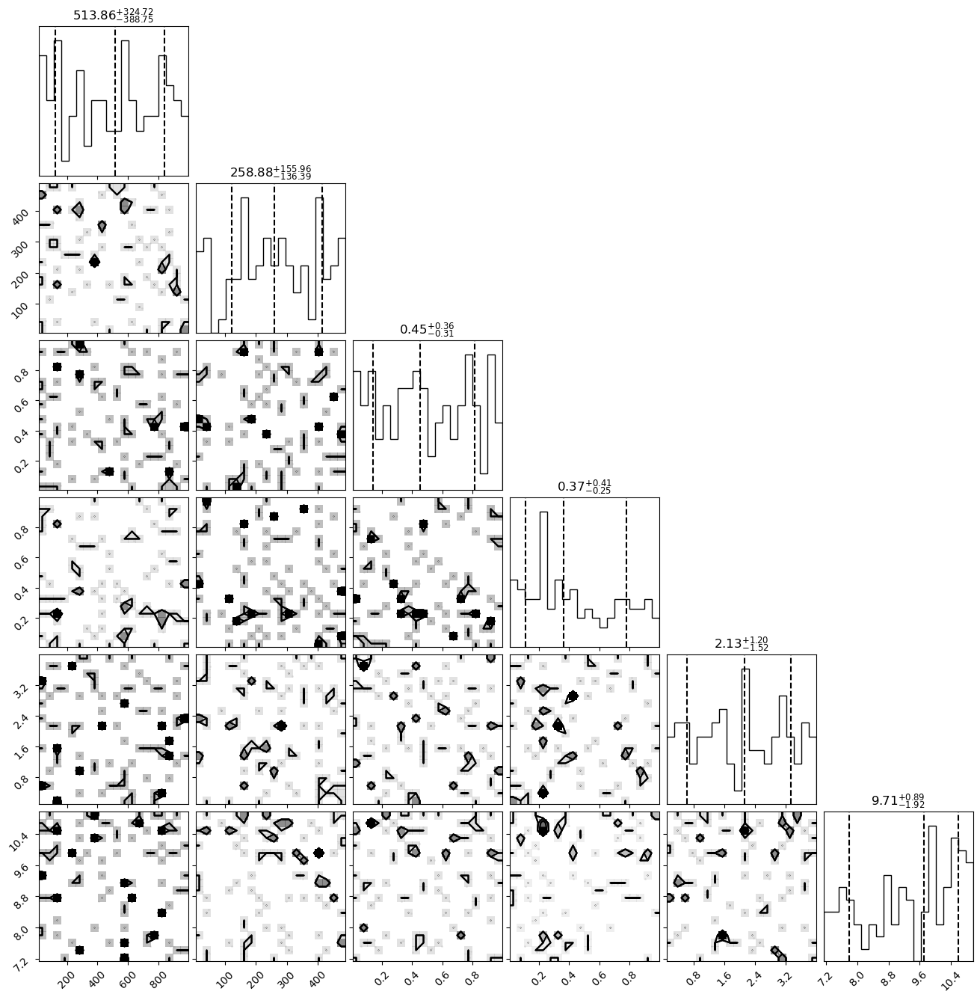

In [40]:
import corner

figure = corner.corner(
    samples_equal, 
    #labels=[...],  # List of parameter names as strings
    quantiles=[0.16, 0.5, 0.84],  # show median and 1 sigma intervals
    show_titles=True,
    title_fmt='.2f',
    title_kwargs={"fontsize": 12}
)

In [20]:
nrows = len(regions_for_mcspf)

ID = [i + 1 for i in range(nrows)]
z_best = [z_true for _ in range(nrows)]
dl = [distance for _ in range(nrows)]
polymax = [7 for _ in range(nrows)]
spec_lim = ['4000,7000' for _ in range(nrows)]
res_file = ['Extracted_resolution.fits' for _ in range(nrows)]

columns = []
columns.append(fits.Column(name='id', format='K', array=np.array(ID, dtype='int64')))
columns.append(fits.Column(name='z_best', format='D', array=np.array(z_best)))
columns.append(fits.Column(name='dl', format='D', array=np.array(dl)))
columns.append(fits.Column(name='polymax', format='J', array=np.array(polymax, dtype='int32')))
columns.append(fits.Column(name='spec_file', format='93A', array=[''] * nrows))  # Optional if not used
columns.append(fits.Column(name='spec_lim', format='9A', array=np.array(spec_lim)))
columns.append(fits.Column(name='res_file', format='72A', array=np.array(res_file)))

for band in phot_dict[0].keys():
    columns.append(fits.Column(name='f_' + band, format='D', array=np.zeros(nrows)))
    columns.append(fits.Column(name='e_' + band, format='D', array=np.zeros(nrows)))

# Create the HDU
coldefs = fits.ColDefs(columns)
hdu = fits.BinTableHDU.from_columns(coldefs)

# Fill in photometry
for i in range(nrows):
    for band in phot_dict[i].keys():
        hdu.data[i]['f_' + band] = phot_dict[i][band][0]
        hdu.data[i]['e_' + band] = phot_dict[i][band][1]

spec_filepath = 'DATA/Coma/NGC4848/'
for i,spec in enumerate(spectra_mcspf):
    w = spec.w
    flux = spec.flux
    err = spec.flux_err

    # Create the fits file:
    primary_hdu = fits.PrimaryHDU(flux/1e-20)
    hdu_error = fits.ImageHDU(err/1e-20)
    hdu_wavelength = fits.ImageHDU(w)
    # Combine into HDUList
    hdul = fits.HDUList([primary_hdu, hdu_error, hdu_wavelength])

    # Write to file
    output_file = 'DATA/Coma/NGC4848/MUSE_spec_region_'+str(i)+'.fits'
    hdul.writeto(output_file, overwrite=True)

    hdu.data[i]['spec_file'] = 'MUSE_spec_region_'+str(i)+'.fits'


print(hdu.data[1])


# Assume your BinTableHDU is called `bintable_hdu`
primary_hdu = fits.PrimaryHDU()  # Empty primary header
hdul = fits.HDUList([primary_hdu, hdu])

hdul.writeto('DATA/Coma/NGC4848/phot_spec_file_mcspf.fits', overwrite=True)

(2, 0.023974, 104.0, 7, 'MUSE_spec_region_1.fits', '4000,7000', 'Extracted_resolution.fits', 0.046786534890435535, 0.00046786534890435537, 0.023788996526073244, 0.000391131699465705, 0.06762518362718346, 0.00708748751105021, 0.5966653043742658, 0.013693340749472031, 0.2760264290459834, 0.004372823287755437, 0.45691204406952374, 0.006884204581027636, 0.7246771016079223, 0.03094095817648829, 4.475535732120695, 13.243662192080413, 5.0345328825338855, 16.89759433552914, 1.5915674447177446, 2.4968180903563035, 2.738281515406205, 0.07186075073252948, 0.5885940828245839, 0.00671396966510285, 0.34276742305208824, 0.007288064227278823, 0.7812894709659144, 0.03983306008147233, 0.32173274219530273, 0.007068264807704972, 0.33381787199116647, 0.039783804252511094, 0.43514485399159103, 0.0337392233655909, 0.4996069776353356, 0.006808831397091663, 16.654985095930446, 1.0969104545583843, 37.08463630478641, 1.2057328428732732, 7.270501651017983, 1.0350549627125127, 0.5783307212034952, 0.006135211619419

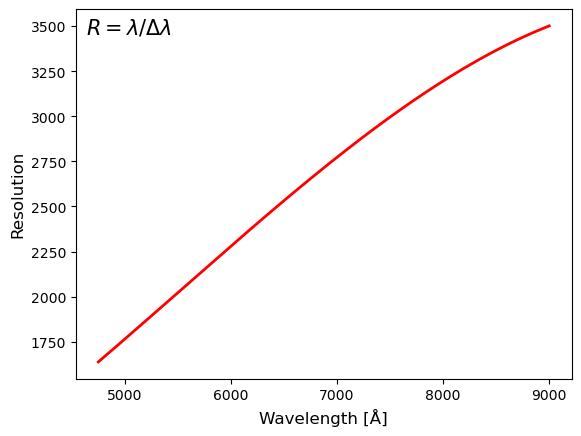

In [28]:
wl_res_plot = spectra_mcspf[0].wl
res_plot_values = spectra_mcspf[0].resolution

plt.plot(wl_res_plot, res_plot_values, lw=2, c='red',label='MUSE');
plt.xlabel('Wavelength [Å]',fontsize=12)
plt.ylabel('Resolution',fontsize=12)
#plt.title('MUSE spectral resolution')

plt.text(0.02, 0.98, r'$R=\lambda/\Delta\lambda$', fontsize=15,transform=plt.gca().transAxes,
         va='top', ha='left')
plt.show()


In [3]:
import numpy as np
import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings("ignore")

# NGC 4848

NGC 4848 is a bright ($M_B = -20.5$), edge-on SBab galaxy located at the north-western periphery of the X-ray-emitting region of the Coma Cluster, at a projected distance of $\sim 0.75$ Mpc from the cluster center (Fossati et al. 2012), and a small line-of-sight velocity relative to the cluster mean ($\Delta v \sim 275~\mathrm{km\ s^{-1}}$). 

Despite its SBab classification, NGC 4848 has an irregular morphology. It hosts a central nuclear source associated with an active galactic nucleus (AGN), characterized by a red color ($g - i = 1.5$ mag) and a line ratio of [NII]$\lambda6584$/H$\alpha = 0.64$ (Gavazzi et al. 2011). At projected radii of $5''{-}10''$, a bright, blue, and clumpy ring of HII regions dominates the morphology. The surface brightness profile in bands tracing older stellar populations shows an exponential fall-off typical of disk galaxies. The galaxy is actively forming stars, with a star formation rate of $\sim 9~M_\odot\, \mathrm{yr}^{-1}$, as derived consistently from H$\alpha$, ultraviolet (UV), far-infrared (FIR), and radio-continuum emission (Fossati et al. 2012). Star formation is especially prominent in the bow shock region surrounding the galactic nucleus, while the galactic outskirts in the south-west of the disc are completely quenched.

Interferometric CO observations by Vollmer et al. (2001) using the Plateau de Bure Interferometer revealed that while the atomic hydrogen (HI) is heavily stripped ($\mathrm{Def_{HI}} = 0.46$; Gavazzi et al. 1989; Bravo-Alfaro et al. 2001), with emission displaced to the north-est of the disk, the molecular gas ($\mathrm{H_2}$) remains centrally concentrated and relatively undisturbed, with a total mass of $\sim 4 \times 10^9~M_\odot$. A secondary CO peak is observed $\sim 8$ kpc northwest of the nucleus, spatially coincident with the remaining HI and a region of intense star formation, as indicated by H$\alpha$ and radio continuum emission. Spectroscopy of this area revealed double-peaked H$\alpha$ line profiles, suggesting the presence of gas with distinct velocity components along the line of sight.

Although RPS is widely accepted as the cause of the irregular morphology of NGC 4848, its current activity level was once debated. Vollmer et al. (2001) proposed that the galaxy passed through the cluster core $\sim 400$ Myr ago, with the current knots of star formation arising from fallback material. However, this scenario was challenged by the discovery of a 65 kpc-long H$\alpha$ tail trailing the galaxy, revealed by deep H$\alpha$ imaging (Fossati et al. 2012), suggesting ongoing RPS. The tail points away from the cluster center and has a low surface brightness of $\log F_{\mathrm{tail}} = -14.40\pm0.12~\mathrm{erg~cm^{-2}~s^{-1}}$.

The galaxy’s inferred velocity in the plane of the sky is $\sim 1330~\mathrm{km~s^{-1}}$, derived from the projected velocity dispersion of Coma ($\sigma_{\mathrm{vel}} = 940~\mathrm{km~s^{-1}}$) as $V \sim \sqrt{2} \sigma_{\mathrm{vel}}$. Subtracting the mean Coma velocity from NGC 4848’s heliocentric velocity yields a line-of-sight velocity component of only $V_\parallel = 275~\mathrm{km~s^{-1}}$. If the galaxy followed a circular orbit with this configuration, the orbital radius would be $\sim 4$ Mpc—well beyond the Coma Cluster's virial radius. It is more likely that NGC 4848 follows a radial or highly eccentric orbit, falling into the cluster for the first time, as also suggested by the orientation of the H$\alpha$ tail.

Further support for the first-infall scenario comes from the velocity distribution of late-type galaxies (LTGs) in Coma, which are known to have non-Gaussian distributions and higher velocity dispersions than early-type galaxies (ETGs), consistent with radial orbits (Biviano et al. 1997; Boselli \& Gavazzi 2006). This indicates that many spirals, including NGC 4848, may still be in the process of infalling toward the cluster core.

From ram pressure stripping models, assuming exponential profiles for the stars and gas with $R_\mathrm{star} = 5$ kpc and $R_{\mathrm{HI}} = 1.8 \times R_\mathrm{star} = 9$ kpc (Boselli \& Gavazzi 2006), the stripping radius was calculated as $R_\mathrm{strip} = 8.5$ kpc, and the stripped gas mass as $M_\mathrm{strip} \approx 4.7 \times 10^9~M_\odot \sim 0.75 M_{\mathrm{HI,orig}}$ (Fossati et al. 2012). This estimate is consistent with the observed HI deficiency and the mass of ionized gas in the tail. Simulations by Kapferer et al. (2009), using $V_{\mathrm{rel}} = 1000~\mathrm{km~s^{-1}}$ and an ICM density of $\rho = 6 \times 10^{-28}~\mathrm{g~cm^{-3}}$ at the galaxy’s location, show that $\sim 65\%$ of the original HI mass can be stripped within $\sim 200$ Myr. Similar rapid stripping timescales are found in Virgo, e.g. for NGC 4569 (Boselli et al. 2006). These values are much shorter than the Coma crossing time ($\sim 1.6$ Gyr), further supporting a first-passage scenario.

The recombination time of the ionized tail, $\tau_r = (n_e \alpha_{32})^{-1}$, is found to be $\sim 10^7.8$ yr, consistent with the survival time of the ionized gas inferred from the tail length and motion, $\sim 10^{7.6}$ yr. While part of the ionization could be due to the galaxy’s HII regions or AGN, in-situ ionization powered by turbulence and shock heating within the tail is also supported by simulations (Tonnesen \& Bryan 2010).

In addition to the diffuse ionized gas, the tail of NGC 4848 contains compact star-forming knots. These are visible in r-band and FUV images (Smith et al. 2010), with H$\alpha$ + [NII] fluxes of $3.6 \times 10^{-16}$, $2.1 \times 10^{-16}$, and $7.4 \times 10^{-16}~\mathrm{erg~cm^{-2}~s^{-1}}$, corresponding to H$\alpha$ luminosities of $4 \times 10^{38}$, $2.3 \times 10^{38}$, and $8 \times 10^{38}~\mathrm{erg~s^{-1}}$ respectively. These values are typical of HII regions and together contribute $\sim 25\%$ of the total luminosity of the tail. Similar “fireballs” are observed in other stripped galaxies in Coma (e.g. GMP3016 and GMP4060; Yagi et al. 2010) and Virgo (e.g. VCC 1217 and VCC 1249; Fumagalli et al. 2011; Arrigoni Battaia et al. 2012).


<img src="images/NGC4848.png" width="500"/>